# RPM Tumor Time Series Analysis


In [1]:

import scvelo as scv
import scanpy as sc
import os.path as op
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sys
sys.path.insert(1, "/Users/smgroves/Dropbox (VU Basic Sciences)/pycharm_workspace/mazebox/")
import mazebox as mb

In [2]:
# !pip install phate

# Preprocessing

## Read in Files

In [2]:
indir = "/Users/smgroves/Documents/pycharm_workspace/archetypes/data/single-cell/looms/RPM"

samples = ['SRR11594440','SRR11594441','SRR11594442','SRR11594443','SRR11594444','SRR11594445','SRR11594446']
[a1,a2,a3,a4,a5,a6,a7] = [mb.pp.read_loom(sample, indir) for sample in samples]


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


## Filter and concatenate

In [3]:
tfs = ['SP100', 'FOSL1', 'HES1', 'NFKBIZ', 'RELB', 'EPAS1', 'BCL3', 'REST', 'SP110', 'NFKB2', 'TEAD2', 'HMG20B', 'SIX5',
       'RARG', 'TEAD4', 'ZNF217', 'SP140L', 'SOX18', 'HOXC13', 'STAT6', 'ETV4', 'KLF2', 'MITF', 'NR0B2', 'ASCL1', 'ZBTB7C', 'ELF3',
       'RORC', 'FOXA2', 'ETS2','TOX3', 'XBP1', 'ST18', 'FOXA1', 'OVOL2', 'ZNF664', 'TBX10', 'PROX1', 'ETV6', 'CEBPD', 'TFCP2L1', 'FOXJ3',
       'ZNF407', 'ZNF511','ZNF396', 'RBPJ', 'ZSCAN31', 'HOXB5', 'ZNF3', 'TSHZ2', 'ZBTB16', 'ZNF10', 'FLI1', 'GATA4', 'NR0B1', 'NHLH1',
       'NEUROD6', 'ZNF581', 'TCF15', 'LYAR', 'ISL2', 'OLIG2', 'NEUROD1', 'INSM1', 'PAX5', 'SP6', 'MYT1', 'HES6', 'ZNF24', 'ISL1', 'ZNF397',
       'SOX11', 'ZNF253', 'SMAD4', 'RBP1', 'ONECUT2', 'ZNF711', 'DLX5', 'GRIP1', 'ZNF157', 'ZNF713', 'ZNF136', 'FOXN4', 'PATZ1', 'ZNF491',
       'ZBTB21', 'KLF12', 'ZNF501', 'ZNF785', 'CXXC1', 'ZNF324', 'ZNF764', 'ZBTB18', 'KAT8', 'ZNF334', 'POU4F1', 'ZNF250', 'ZNF132',
       'SALL2', 'DLX6', 'MBD1','SOX1', 'ZFP3', 'ZNF543', 'POU2F1', 'NONO', 'SMAD9', 'ZKSCAN2', 'TCF12', 'VEZF1', 'TOX', 'BHLHE22', 'MTA1',
       'TCF3', 'SCRT2', 'RFX7','NHLH2', 'SCRT1', 'RCOR2', 'PURG', 'TBPL1', 'TCF4', 'EBF1', 'ZNF749', 'NEUROD2', 'ZNF423', 'BACH2', 'GLI1',
       'ZFP64','NKX2-1', 'MYC', 'YAP1', 'POU2F3', 'MYCL', 'MYCN', 'ASCL2', 'AVIL', 'CHAT', 'GFI1B',
      'CHGA','EPCAM']


Dropkick is a tool to get rid of empty and low-quality droplets based on ambient reads. It should be applied to each sample separately, so we will apply first and then concantenate the data into one AnnData object.

In [7]:
batch_categories = ['day_4','day_7','day_11','day_14','day_17','day_21']
batch_key = 'timepoint'

a1 = a1.concatenate(a2) #concatenate both day_4 datasets into one
adatas = [a1,a3,a4,a5,a6,a7] #a2 is already merged with a1

adata = mb.pp.dropkick_recipe(adatas, verbose=False, batch_categories = batch_categories, batch_key = batch_key,
                                                X_final = 'log1p_norm',plot = False,
                                                retain_genes=[i.capitalize() for i in tfs])



Chosen lambda value:
	[0.0023558]
Assigning scores and labels
Done!

Chosen lambda value:
	[0.02641181]
Assigning scores and labels
Done!

Chosen lambda value:
	[0.02719351]
Assigning scores and labels
Done!

Chosen lambda value:
	[0.03741653]
Assigning scores and labels
Done!

Chosen lambda value:
	[0.02569537]
Assigning scores and labels
Done!

Chosen lambda value:
	[0.02330141]
Assigning scores and labels
Done!

Filtered out 10472 genes that are detected 3 counts (spliced).
calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


## Cell Cycle Regression

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


... storing 'batch' as categorical
... storing 'phase' as categorical


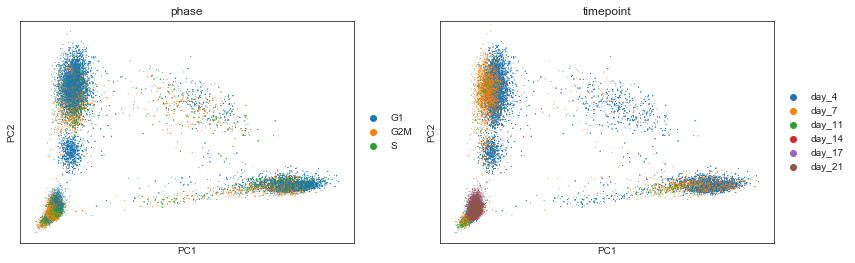

In [8]:
# sc.pp.scale(adata)
scv.tl.score_genes_cell_cycle(adata)
sc.tl.pca(adata)
sc.pl.pca_scatter(adata, color=['phase','timepoint'])

In [ ]:
sc.pp.regress_out(adata, ['S_score', 'G2M_score'])
sc.pp.scale(adata)

In [ ]:
sc.tl.pca(adata)
sc.pl.pca_scatter(adata, color='phase')

## Dimensionality Reduction and RNA Velocity

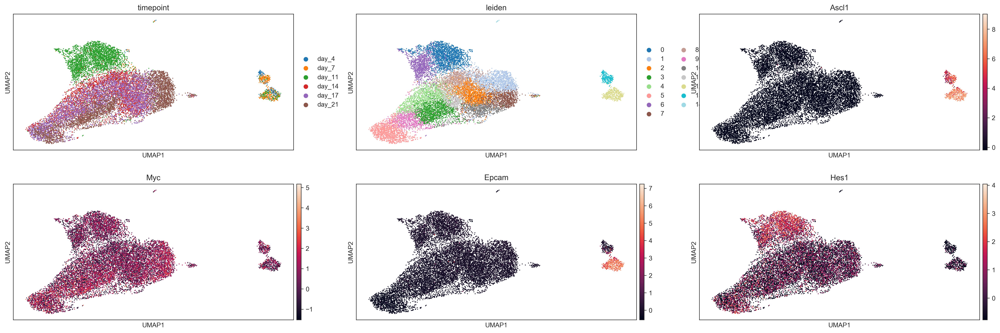

In [73]:
import matplotlib.pyplot as plt
# sc.pp.neighbors(adata)
# sc.tl.leiden(adata)
# sc.tl.umap(adata, random_state = 1)
sc.pl.umap(adata, color = ['timepoint','leiden','Ascl1','Myc','Epcam','Hes1'], ncols = 3)


Compare our filtered dataset to the Ireland et al. paper. They have a spreadsheet of the barcodes they kept for downstream analyses.

In [ ]:
bcs = pd.read_csv('../data/RPM_cell_barcodes.csv', index_col=0, header = 0)
bcs['barcode_short'] = [i.split('_')[0] for i in bcs['Tumor Cell Barcodes']]

adata.obs['barcode'] = [str(i.split(":")[1].split('x')[0]) for i in adata.obs_names]

filtered_cells = []
for i in adata.obs['barcode']:
    if i in list(bcs['barcode_short']): 
        filtered_cells.append(True)
    else:
        filtered_cells.append(False)
adata.obs['kept'] = filtered_cells
sc.pl.umap(adata, color = 'kept')

In [ ]:
adata = adata[adata.obs['kept'],:]

In [ ]:
adata.write_h5ad('../int/adata01.h5ad')

In [ ]:
adata = sc.read_h5ad('../int/adata01.h5ad')

# Calculating Velocity

In [ ]:
sc.pp.neighbors(adata, random_state=1) #recalculating after subsetting data and cell cycle correction)
sc.tl.pca(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata, random_state=1)
sc.pl.pca(adata, color = 'timepoint')
sc.pl.umap(adata, color = ['timepoint','G2M_score'])


In [ ]:
scv.pp.moments(adata)
scv.tl.velocity(adata, mode = 'deterministic')
scv.tl.velocity_graph(adata)


In [ ]:
sc.tl.tsne(adata, random_state=1)
sc.pl.tsne(adata, color = 'timepoint')

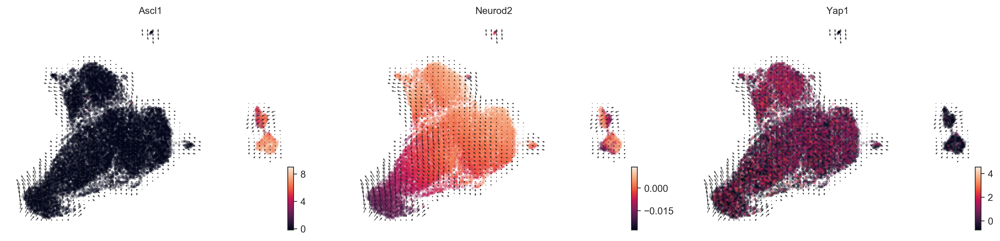

In [74]:
scv.pl.velocity_embedding_grid(adata, basis = 'umap', color = ['Ascl1','Neurod2','Yap1'], figsize = (6,4), alpha=.3, smooth =True)

In [ ]:
# scv.tl.velocity_confidence(adata)

keys = 'velocity_length', 'velocity_confidence'  
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95], basis = 'tsne')

In [ ]:
for g in adata.obs['timepoint'].cat.categories:
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot()
    scv.pl.velocity_embedding_grid(adata[adata.obs['timepoint']==g], basis = 'tsne', ax = ax, show = False, color = 'timepoint', size = 30, alpha = 1, vmax = 4, vmin = 0, title = g)


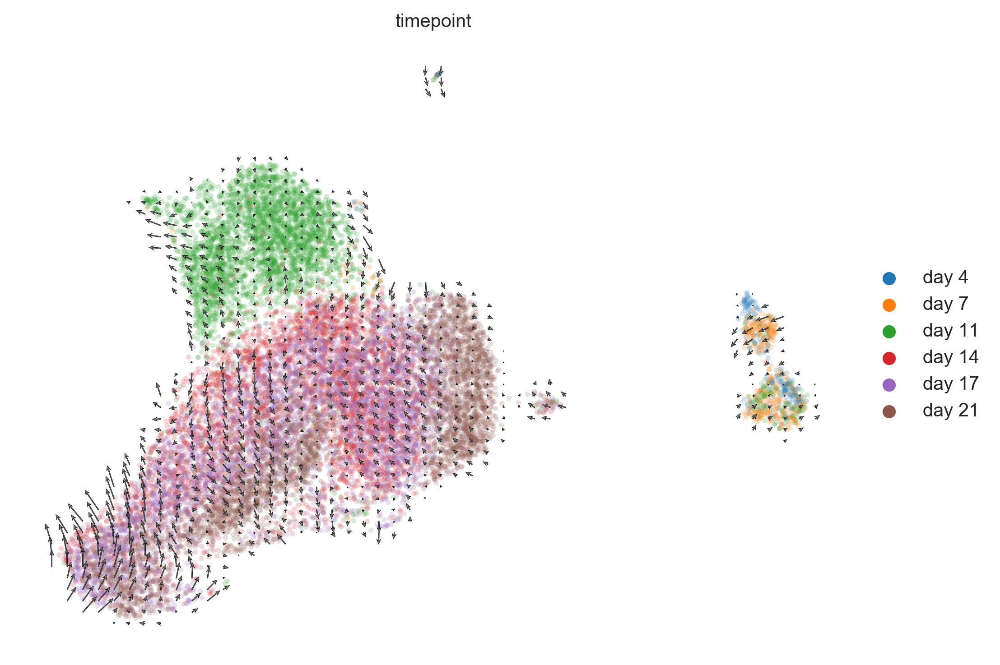

In [75]:
scv.pl.velocity_embedding_grid(adata, basis = 'umap', figsize = (8,6), legend_loc = 'on right',color = 'timepoint')


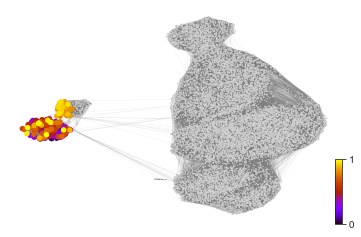

In [64]:
x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=70, n_steps=1000)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)


In [ ]:
scv.pl.velocity_graph(adata, c = 'timepoint')

Let's save the data at this point.

In [ ]:
adata.write_h5ad('../int/adata02.h5ad')

In [ ]:
adata = sc.read_h5ad('../int/adata02.h5ad')

# Signature Subtyping

In [2]:
import mazebox as mb
import scvelo as scv
import scanpy as sc
import os.path as op
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
# adata = sc.read_h5ad('../int/rpm/adata06.h5ad')
sig_matrix = pd.read_csv('../data/sig_matrix_ParTI.csv', header =0, index_col = 0)
sig_matrix = sig_matrix / np.linalg.norm(sig_matrix, axis=0)
ind = []
for i in sig_matrix.index:
    ind.append(i.capitalize())
sig_matrix.index = ind


Trying to set attribute `.obs` of view, copying.


Transforming tumor data...
Gene signature matrix now has shape:  (94, 5)
Tumor data shortened to genes in gene list...
(15257, 94)
Tumor data subsetting complete.


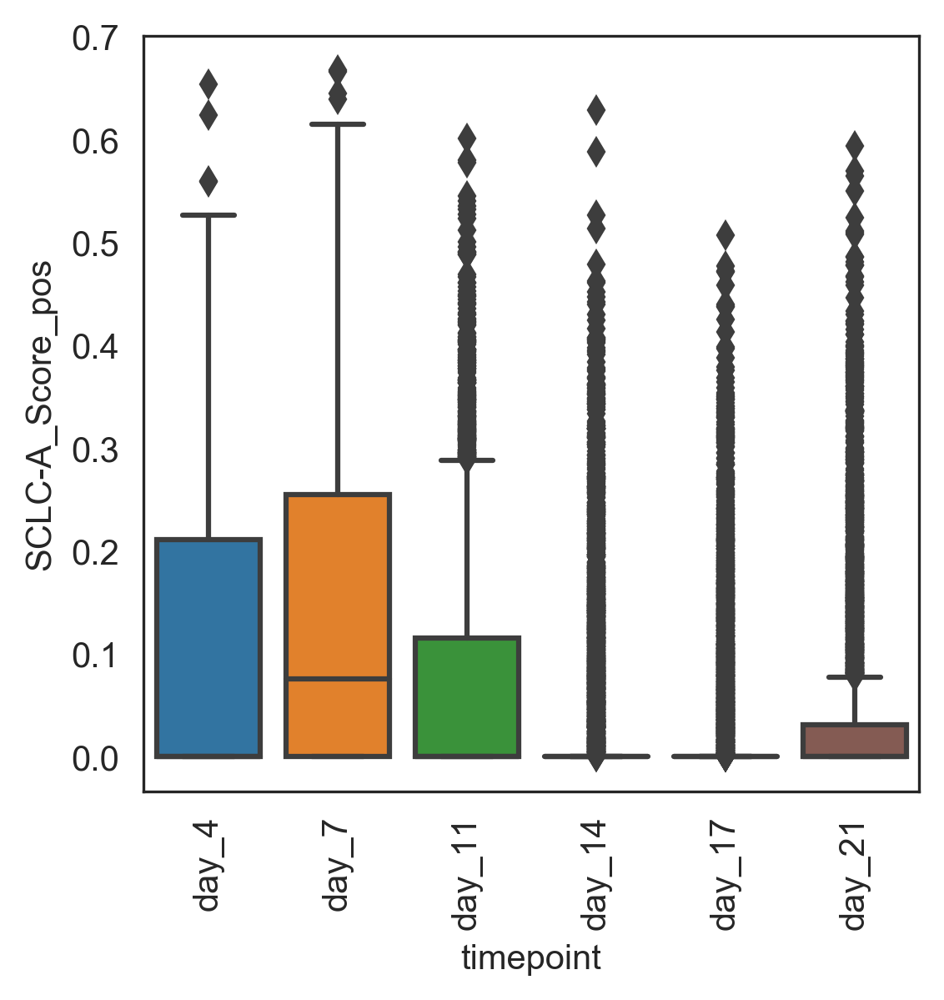

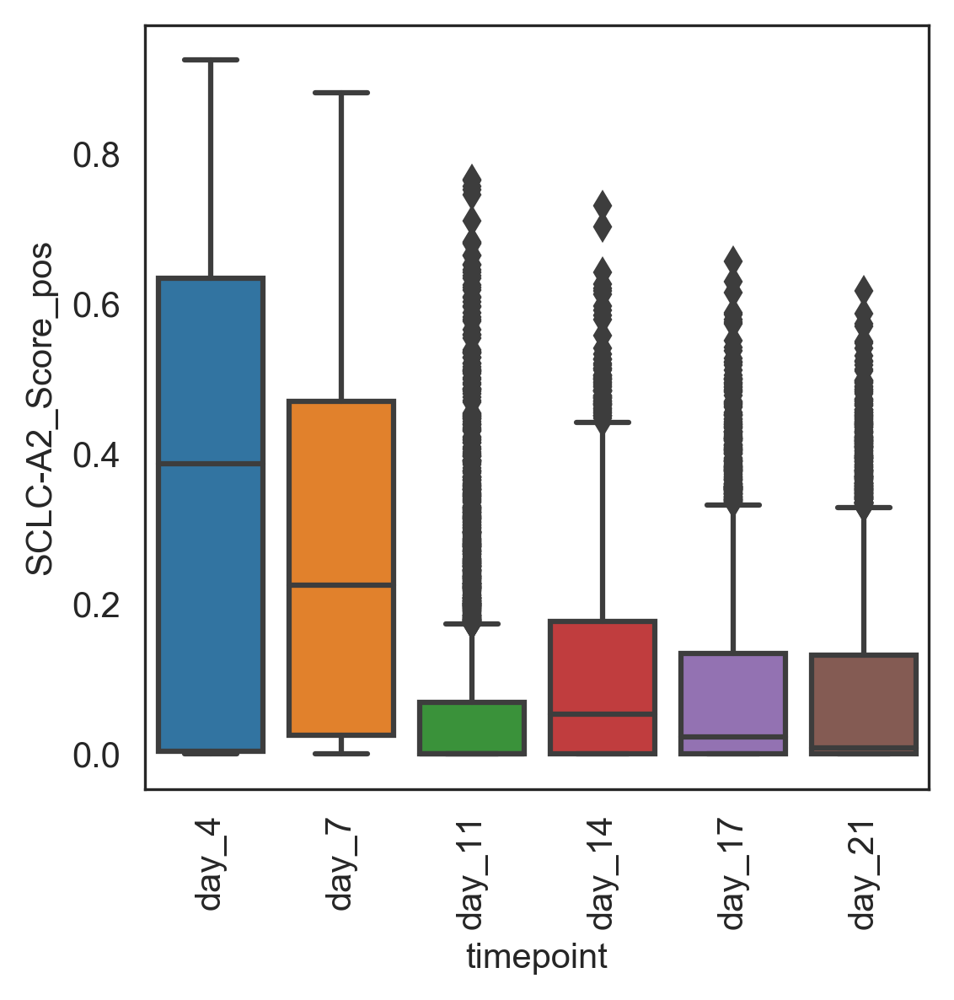

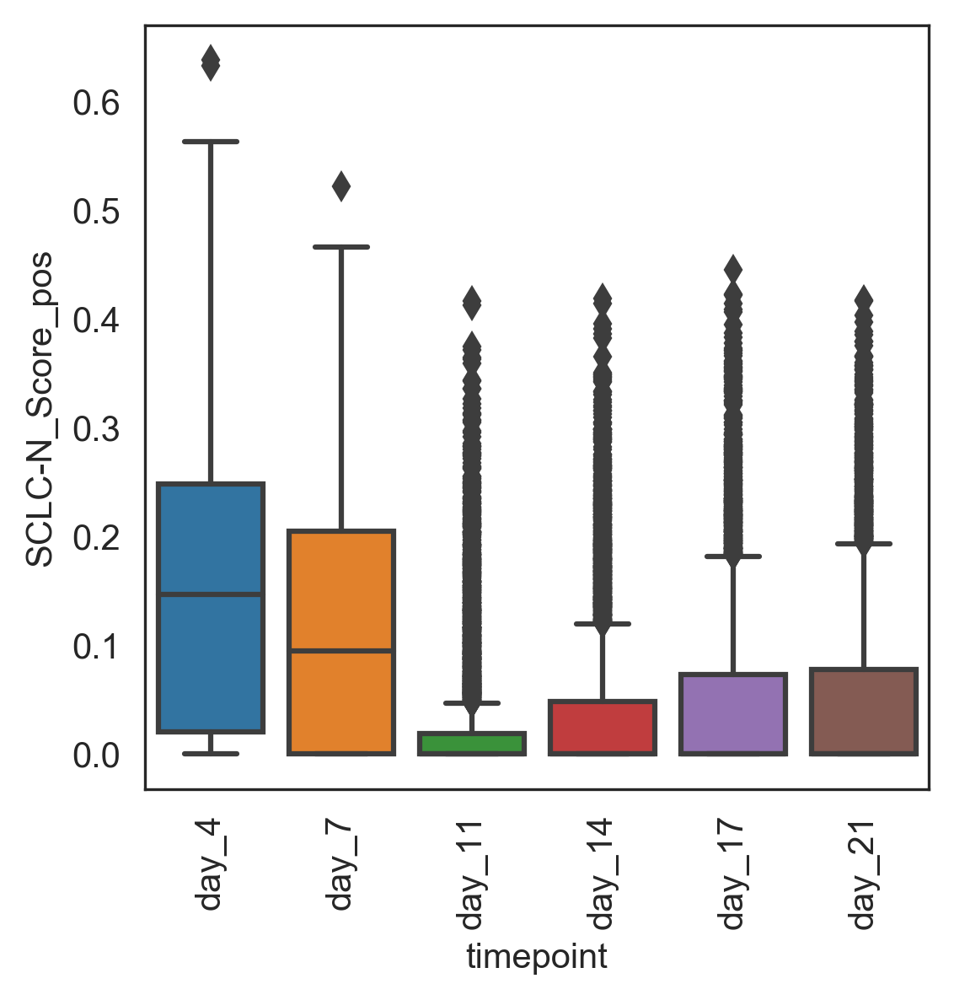

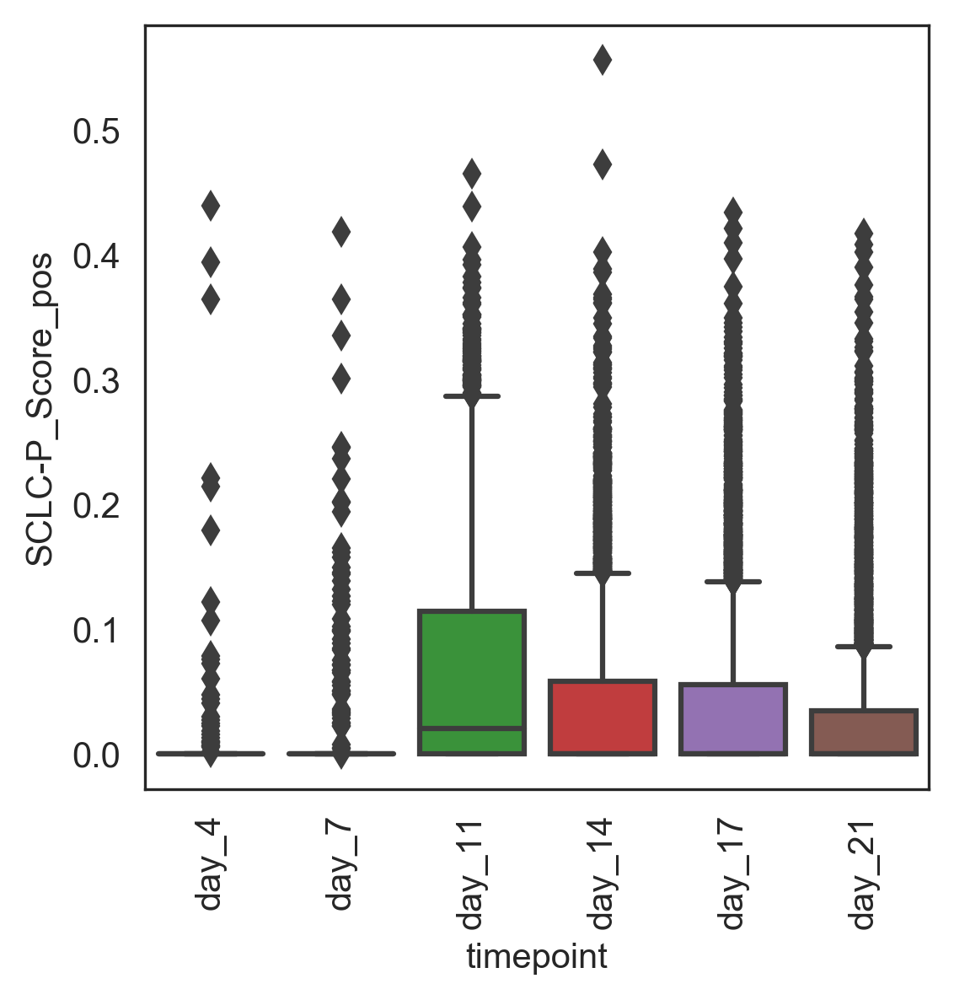

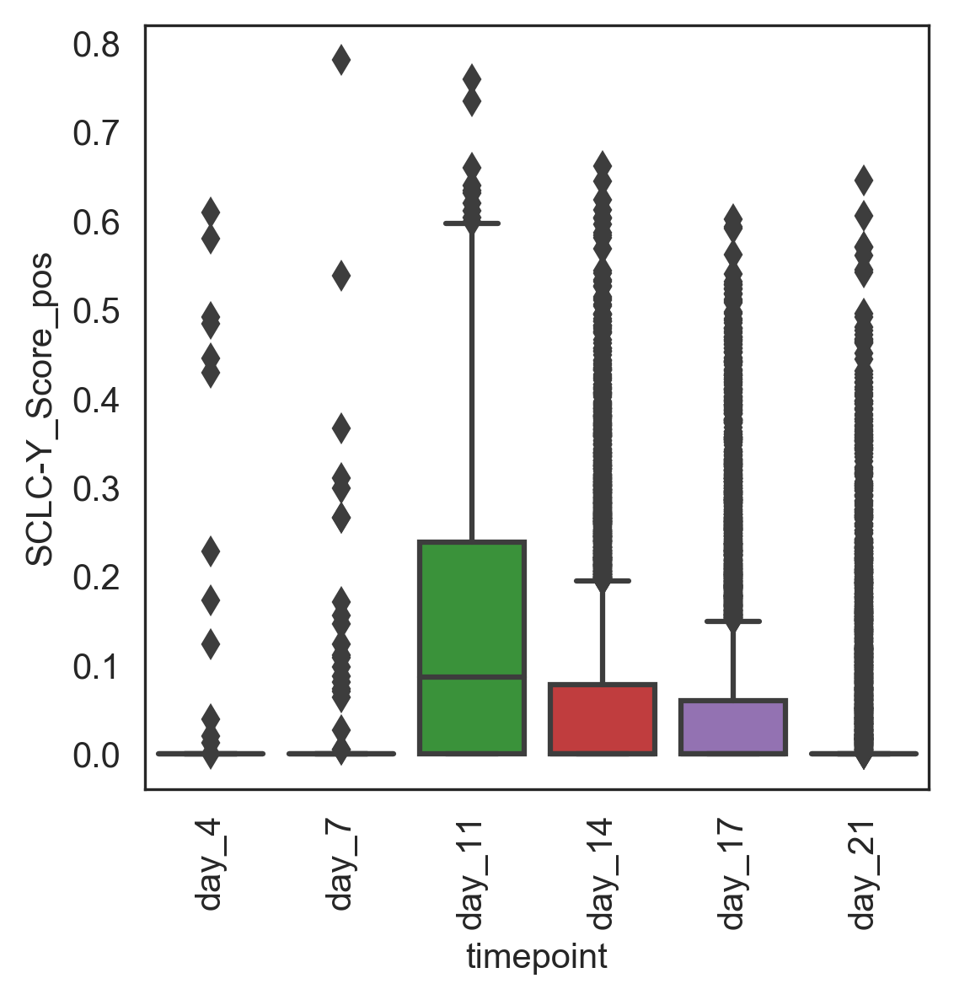

In [12]:
adata, adata_small, sig_matrix2 = mb.ar.phenotyping_recipe(adata, sig_matrix, groupby = 'timepoint', save_as = 'rpm')


In [13]:
adata.write_h5ad('../int/rpm/adata05.h5ad')


... storing 'Phenotype' as categorical


... storing 'Phenotype' as categorical


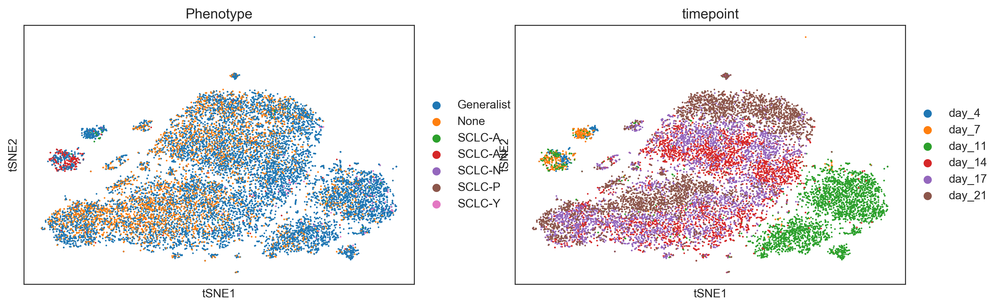

In [14]:
sc.pl.tsne(adata_small, color = ['Phenotype','timepoint'])

Index(['SCLC-A2_Score', 'SCLC-N_Score', 'SCLC-P_Score'], dtype='object')


No handles with labels found to put in legend.


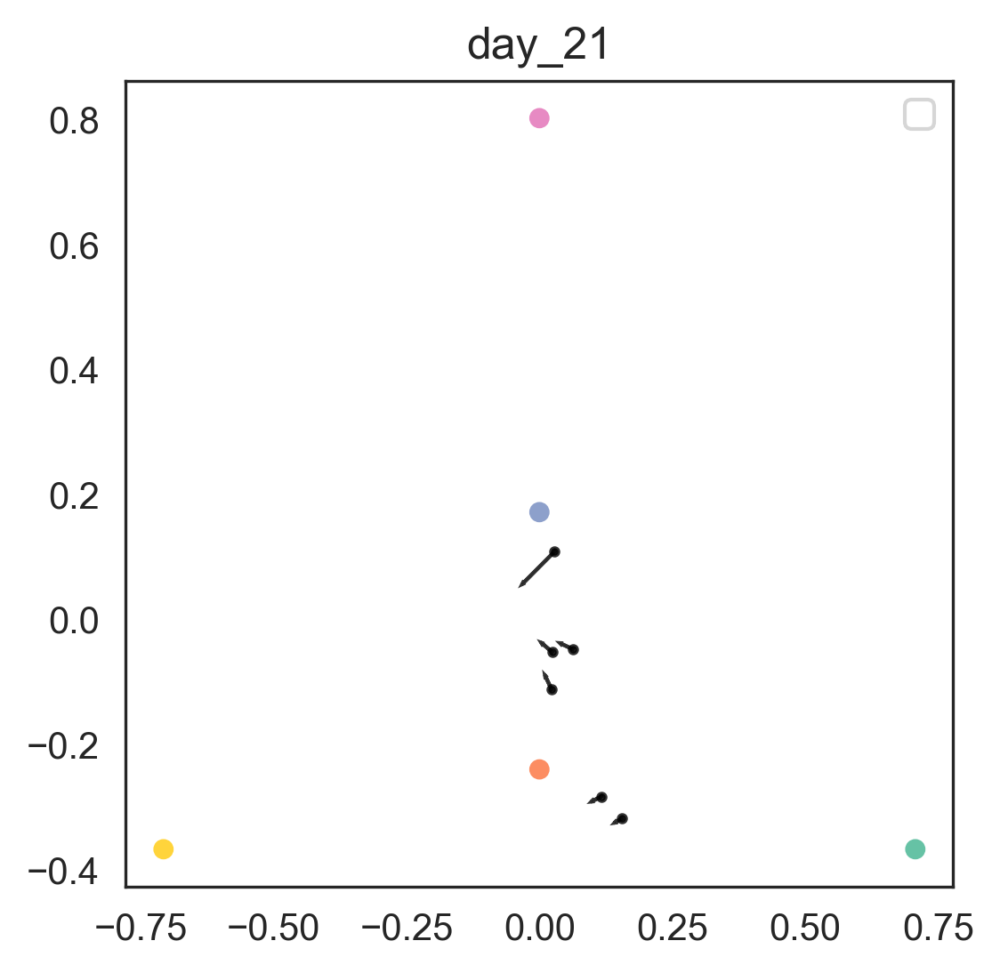

In [171]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'darkgray', 'None': 'lightgrey'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='None',color='Phenotype',grid = False, mean_only = True,
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',num_steps = 40,
                        multiplier=1, figsize=(4,4), score_name = '_Score', alpha = .8, s = 4, sizes = 20, arrows = True)



In [15]:
phenotype = []

df = adata.obs[[f"{x}_Score_pos" for x in ['SCLC-N', 'SCLC-A', 'SCLC-P', 'SCLC-Y', 'SCLC-A2']]]

for i, r in df.iterrows():
    test = r * (r > 0)
    if test.max() < .1:
        phenotype.append('Unclassified')

    elif test.max() > .5:
        #     if (test/test.sum()).max()>.9:
        phenotype.append(r.idxmax().split('_')[0])
    else:
        phenotype.append(r.sort_values(ascending=False)[0:2].sort_index().index[0].split('_')[0]+"_"+r.sort_values(ascending=False)[0:2].sort_index().index[1].split('_')[0])


In [16]:
adata.obs['Phenotype_extended'] = phenotype

In [17]:
pd.crosstab( adata.obs['Phenotype'],adata.obs['Phenotype_extended']).style.background_gradient(cmap='viridis')

Phenotype_extended,SCLC-A,SCLC-A2,SCLC-A2_SCLC-A,SCLC-A2_SCLC-N,SCLC-A2_SCLC-P,SCLC-A2_SCLC-Y,SCLC-A_SCLC-N,SCLC-A_SCLC-P,SCLC-A_SCLC-Y,SCLC-N,SCLC-N_SCLC-P,SCLC-N_SCLC-Y,SCLC-P,SCLC-P_SCLC-Y,SCLC-Y,Unclassified
Phenotype,,,,,,,,,,,,,,,,
Generalist,0,0,232,2974,790,1582,655,1162,1252,0,1057,601,0,617,0,0
None,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3876
SCLC-A,50,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
SCLC-A2,0,290,0,0,0,0,0,0,0,0,0,0,0,0,0,0
SCLC-N,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0
SCLC-P,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
SCLC-Y,0,0,0,0,0,0,0,0,0,0,0,0,0,0,112,0


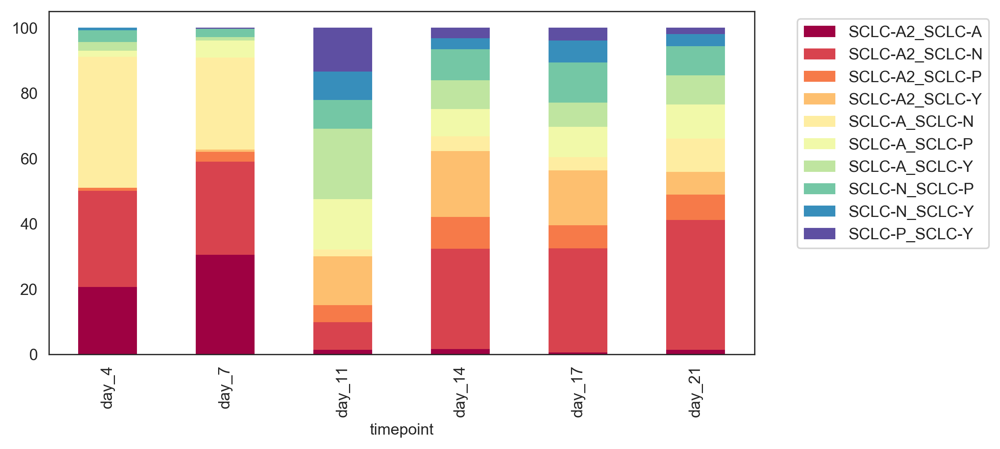

In [19]:
_adata = adata[adata.obs['Phenotype'] == 'Generalist']
plt.rcParams["figure.figsize"] = [8, 4]
((pd.crosstab(_adata.obs["timepoint"], _adata.obs['Phenotype_extended']).T /
  pd.crosstab(_adata.obs["timepoint"], _adata.obs['Phenotype_extended']).sum(axis=1)) * 100).T.plot(kind='bar',
                                                                                              stacked=True,
                                                                                              linewidth=0, cmap = 'Spectral')
plt.legend(bbox_to_anchor=(1.05, 1))

plt.savefig('./figures/rpm/phenotype_extended_barplot_rpm_timecourse.pdf')

In [20]:
pd.crosstab( adata.obs['Phenotype_extended'],adata.obs['timepoint']).style.background_gradient(cmap='viridis')



timepoint,day_4,day_7,day_11,day_14,day_17,day_21
Phenotype_extended,,,,,,
SCLC-A,8,18,11,4,1,8
SCLC-A2,95,89,50,25,18,13
SCLC-A2_SCLC-A,23,83,36,43,15,32
SCLC-A2_SCLC-N,33,78,236,843,848,936
SCLC-A2_SCLC-P,1,8,144,266,188,183
SCLC-A2_SCLC-Y,0,2,415,556,445,164
SCLC-A_SCLC-N,45,77,60,124,110,239
SCLC-A_SCLC-P,2,14,427,229,244,246
SCLC-A_SCLC-Y,3,3,599,240,198,209


## Newer phenotype classification with labeled generalists
Let's check to see how many samples have significant scores (p>.3) for more than one phenotype.

<BarContainer object of 3 artists>

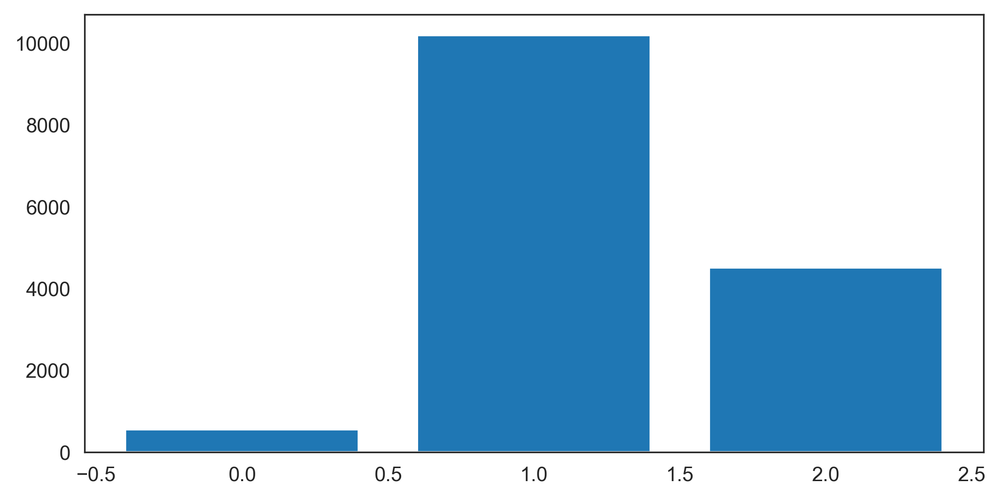

In [21]:
df = adata.obs[[f"{x}_Score_pos" for x in ['SCLC-N', 'SCLC-A', 'SCLC-P', 'SCLC-Y', 'SCLC-A2']]]
# np.unique((df > .3).sum(axis = 1), return_counts=True)[1]
plt.bar(height = np.unique(((df.T/df.sum(axis = 1)).T > .33).sum(axis = 1), return_counts=True)[1], x = range(3), log=False)

In [22]:
arc_pheno = []
arc_aa_type = []

for i,r in df.iterrows():
    r = r/r.sum()
    if (r > .33).sum() > 1:
        arc_aa_type.append('Generalist')
        arc_pheno.append(r.sort_values(ascending=False)[0:2].sort_index().index[0].split('_')[0]+"_"+r.sort_values(ascending=False)[0:2].sort_index().index[1].split('_')[0])
    elif  (r > .33).sum() == 1:
        try:
            arc_aa_type.append(r.idxmax().split('_')[0]+" Specialist")
            arc_pheno.append(r.idxmax().split('_')[0])
        except AttributeError: 
            arc_aa_type.append("Unclassified")
            arc_pheno.append("Unclassified")
    else: 
        arc_aa_type.append("Unclassified")
        arc_pheno.append("Unclassified")
adata.obs['arc_pheno'] = arc_pheno
adata.obs['arc_aa_type'] = arc_aa_type


In [24]:
pd.crosstab(adata.obs['arc_pheno'],adata.obs['timepoint']).style.background_gradient(cmap='viridis')

timepoint,day_4,day_7,day_11,day_14,day_17,day_21
arc_pheno,,,,,,
SCLC-A,24,84,310,375,351,631
SCLC-A2,115,142,372,1055,861,769
SCLC-A2_SCLC-A,9,30,15,19,16,25
SCLC-A2_SCLC-N,22,44,88,282,411,501
SCLC-A2_SCLC-P,1,1,52,129,103,95
SCLC-A2_SCLC-Y,0,2,173,237,198,66
SCLC-A_SCLC-N,26,23,7,4,8,7
SCLC-A_SCLC-P,0,9,220,126,144,111
SCLC-A_SCLC-Y,3,3,252,104,96,89


In [25]:
pd.crosstab( adata.obs['arc_pheno'],adata.obs['Phenotype']).style.background_gradient(cmap='viridis')

Phenotype,Generalist,None,SCLC-A,SCLC-A2,SCLC-N,SCLC-P,SCLC-Y
arc_pheno,,,,,,,
SCLC-A,1263,468,44,0,0,0,0
SCLC-A2,2335,716,0,263,0,0,0
SCLC-A2_SCLC-A,64,50,0,0,0,0,0
SCLC-A2_SCLC-N,1125,197,0,26,0,0,0
SCLC-A2_SCLC-P,267,114,0,0,0,0,0
SCLC-A2_SCLC-Y,587,88,0,1,0,0,0
SCLC-A_SCLC-N,59,16,0,0,0,0,0
SCLC-A_SCLC-P,473,137,0,0,0,0,0
SCLC-A_SCLC-Y,470,64,6,0,0,0,7


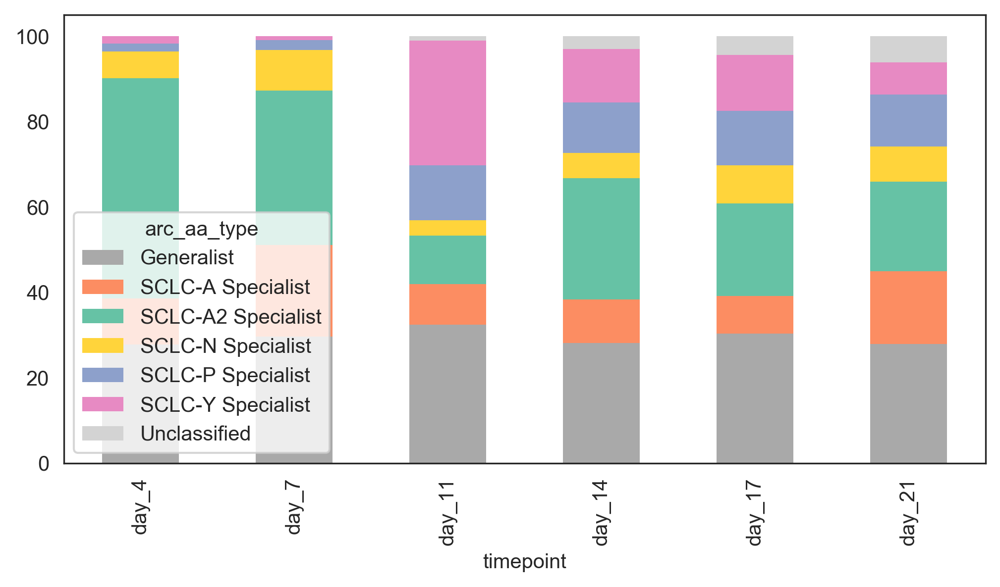

In [15]:
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y Specialist': cp[4], 'SCLC-A Specialist': cp[0], 'SCLC-A2 Specialist': cp[1], 'SCLC-N Specialist': cp[2], 'SCLC-P Specialist': cp[3],
              'Generalist': 'darkgrey', 'Unclassified': 'lightgrey'}
mb.pl.subtype_bar(adata,groupby='timepoint', fname = 'rpm', pheno_name="arc_aa_type", custom_palette=color_dict)

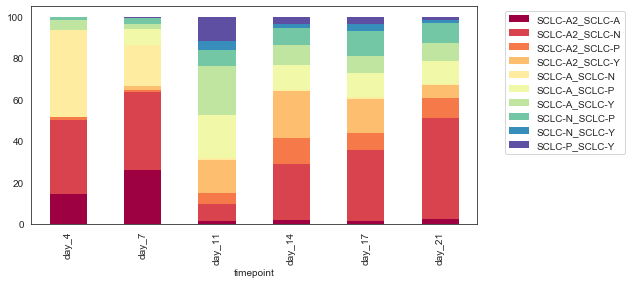

In [18]:
_adata = adata[adata.obs['arc_aa_type'] == 'Generalist']
plt.rcParams["figure.figsize"] = [8, 4]
((pd.crosstab(_adata.obs["timepoint"], _adata.obs['arc_pheno']).T /
  pd.crosstab(_adata.obs["timepoint"], _adata.obs['arc_pheno']).sum(axis=1)) * 100).T.plot(kind='bar',
                                                                                              stacked=True,
                                                                                              linewidth=0, cmap = 'Spectral')
plt.legend(bbox_to_anchor=(1.05, 1))

plt.savefig('./figures/rpm/arc_aa_generalist_subtypes.pdf')

day_4
Index(['SCLC-A2_Score', 'SCLC-N_Score', 'SCLC-A_Score'], dtype='object')


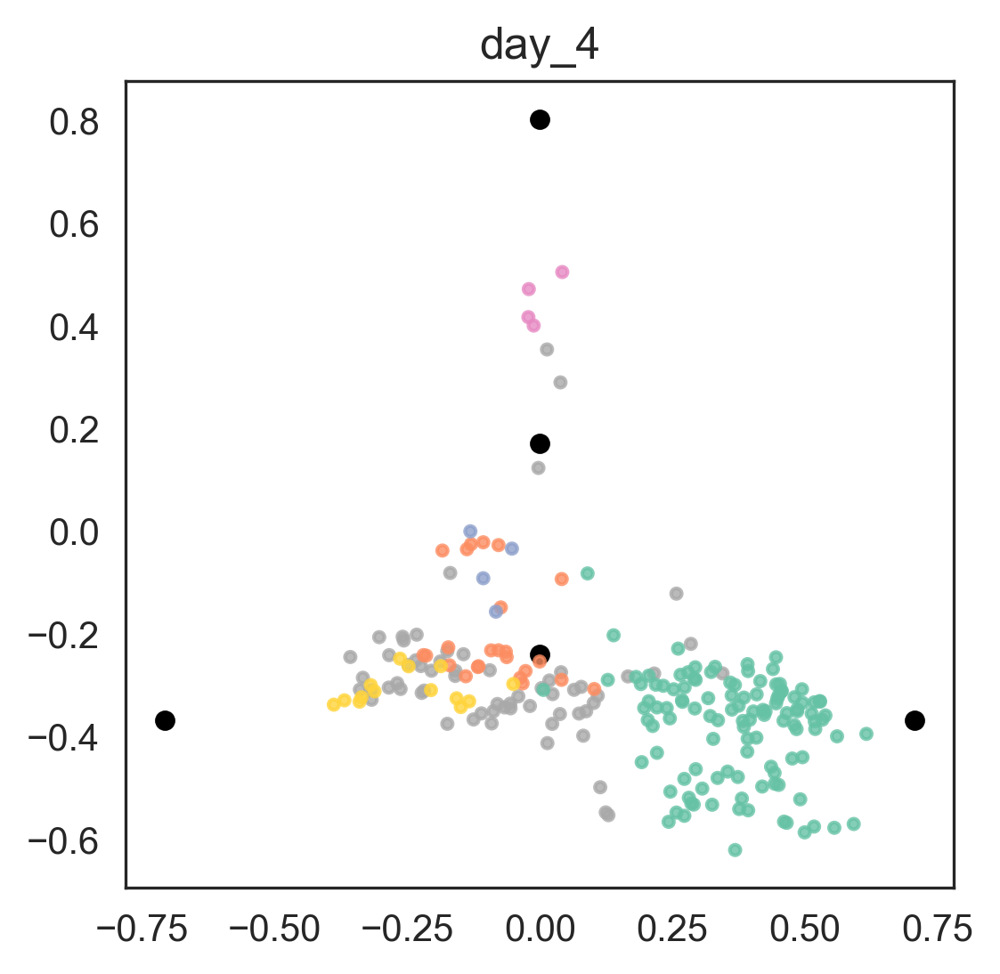

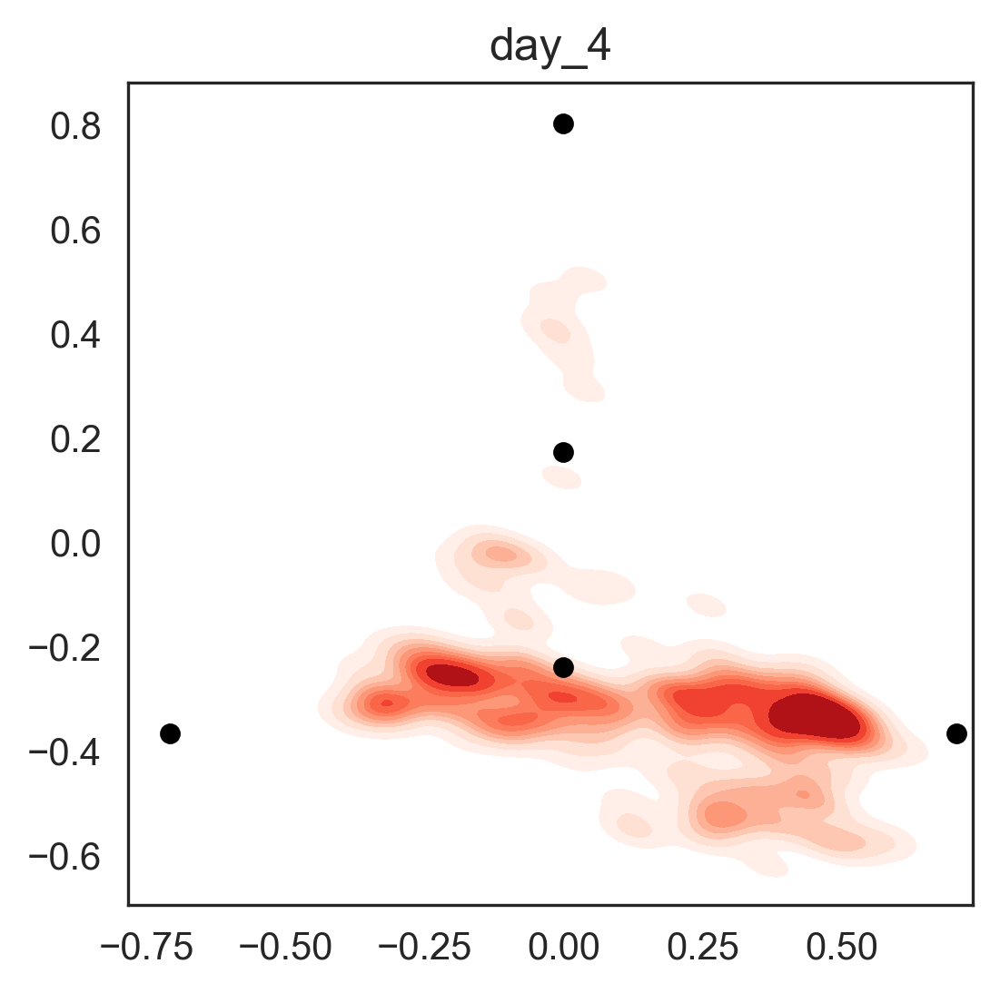

day_7
Index(['SCLC-A2_Score', 'SCLC-N_Score', 'SCLC-A_Score'], dtype='object')


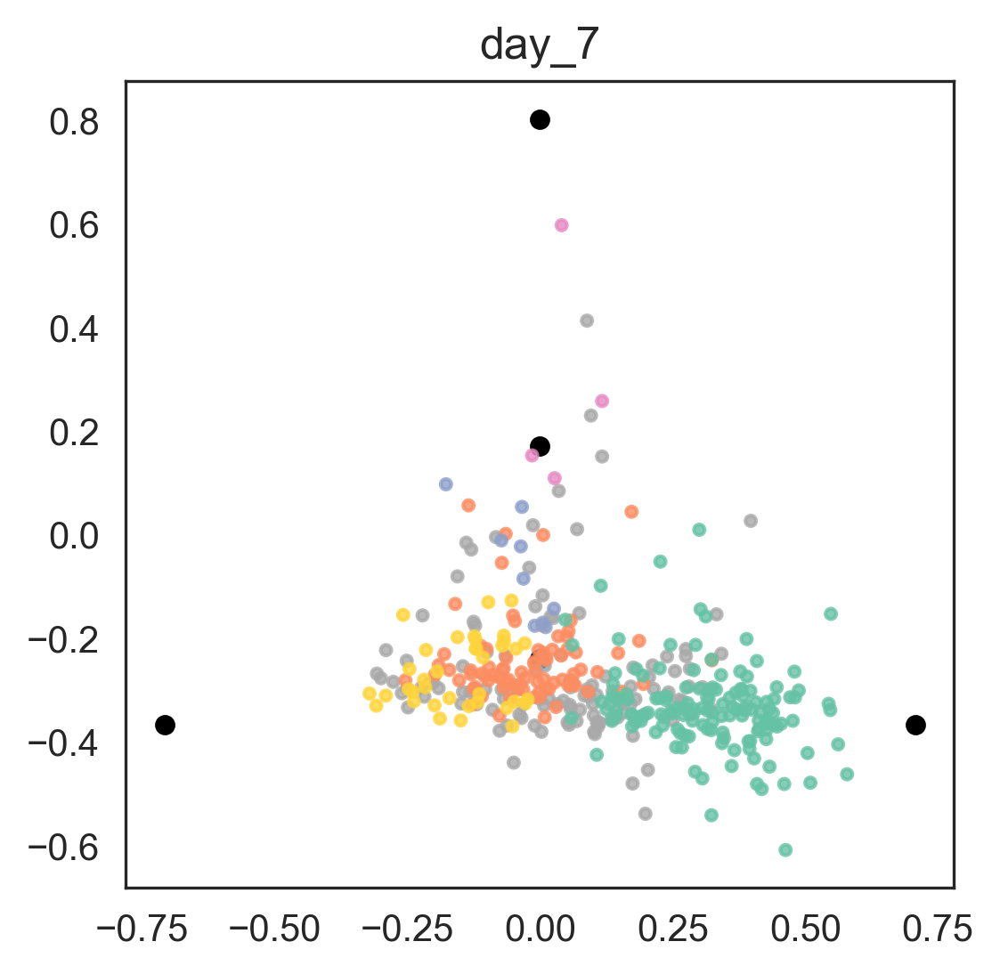

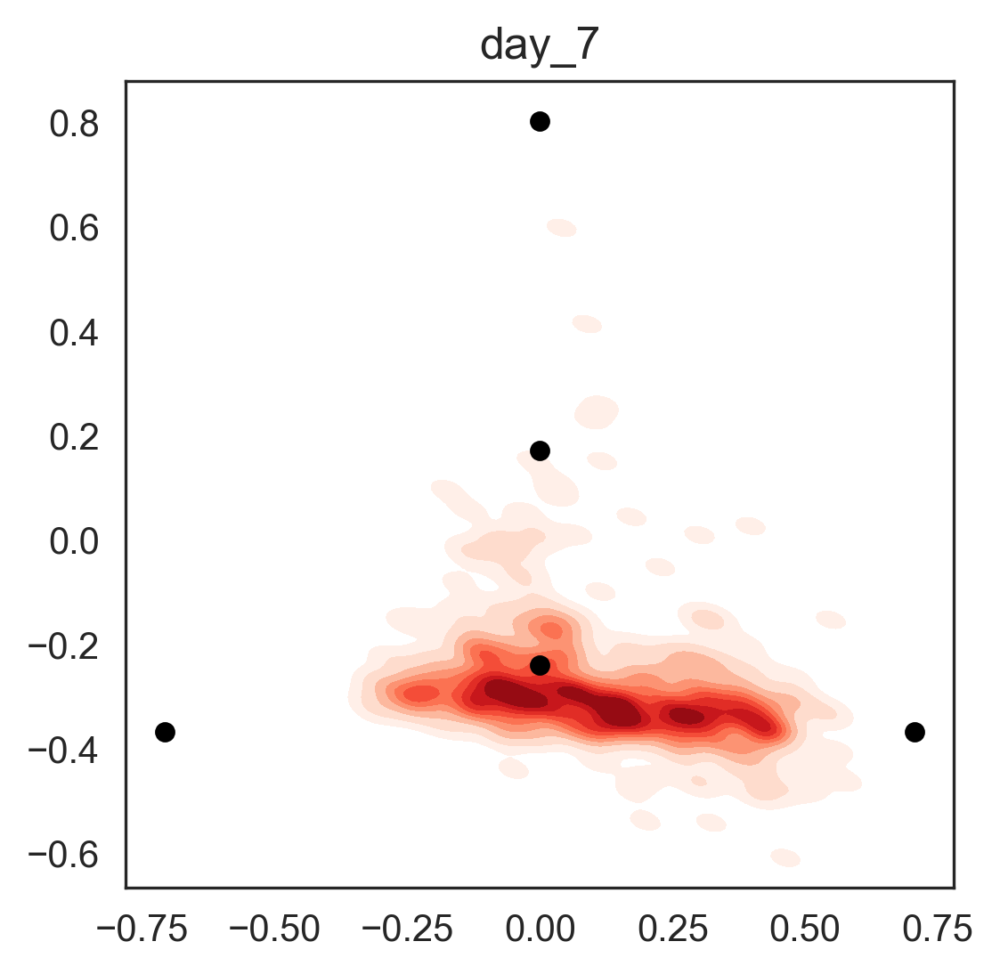

day_11
Index(['SCLC-Y_Score', 'SCLC-P_Score', 'SCLC-A_Score'], dtype='object')


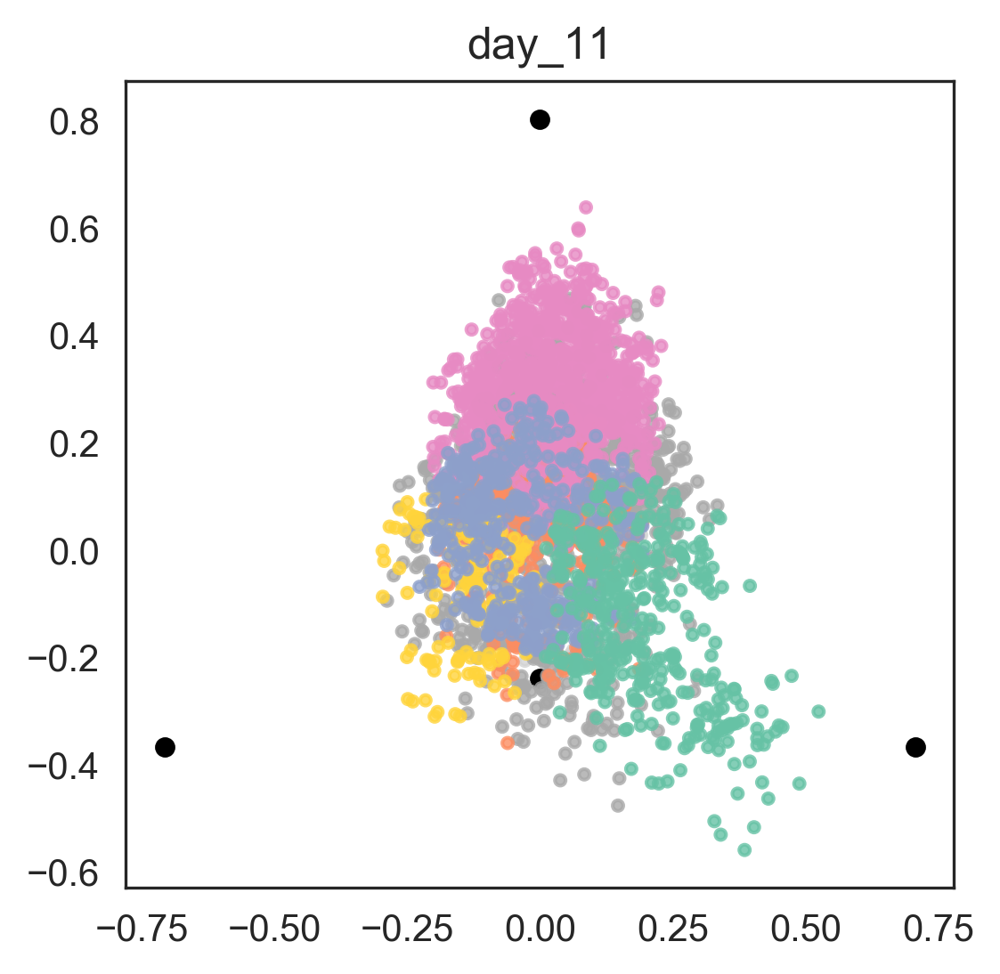

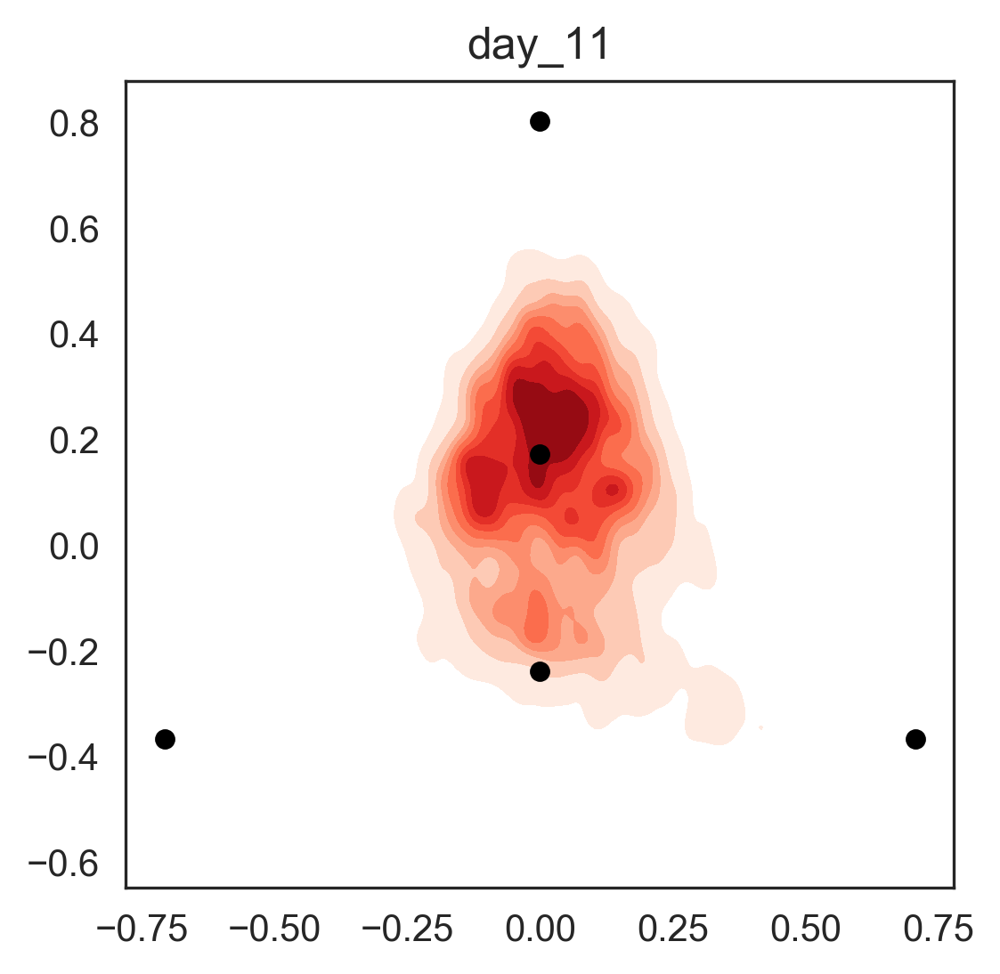

day_14
Index(['SCLC-A2_Score', 'SCLC-N_Score', 'SCLC-P_Score'], dtype='object')


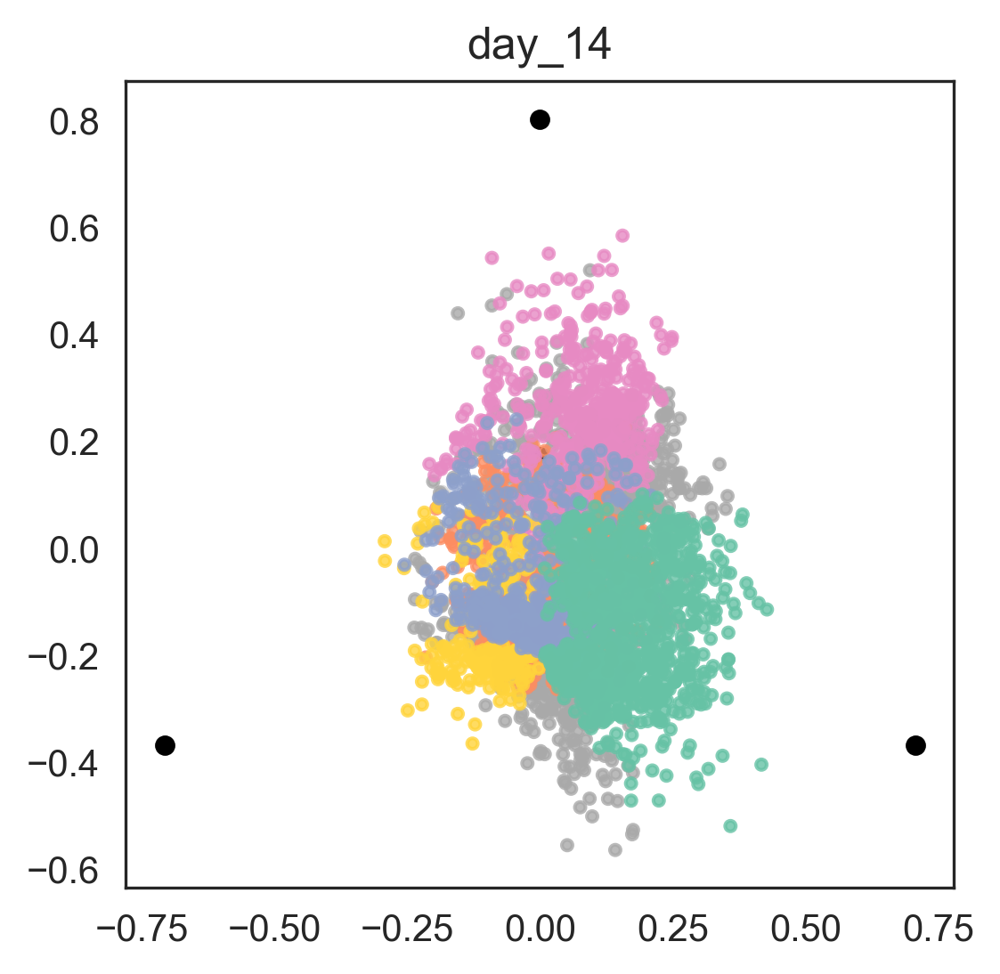

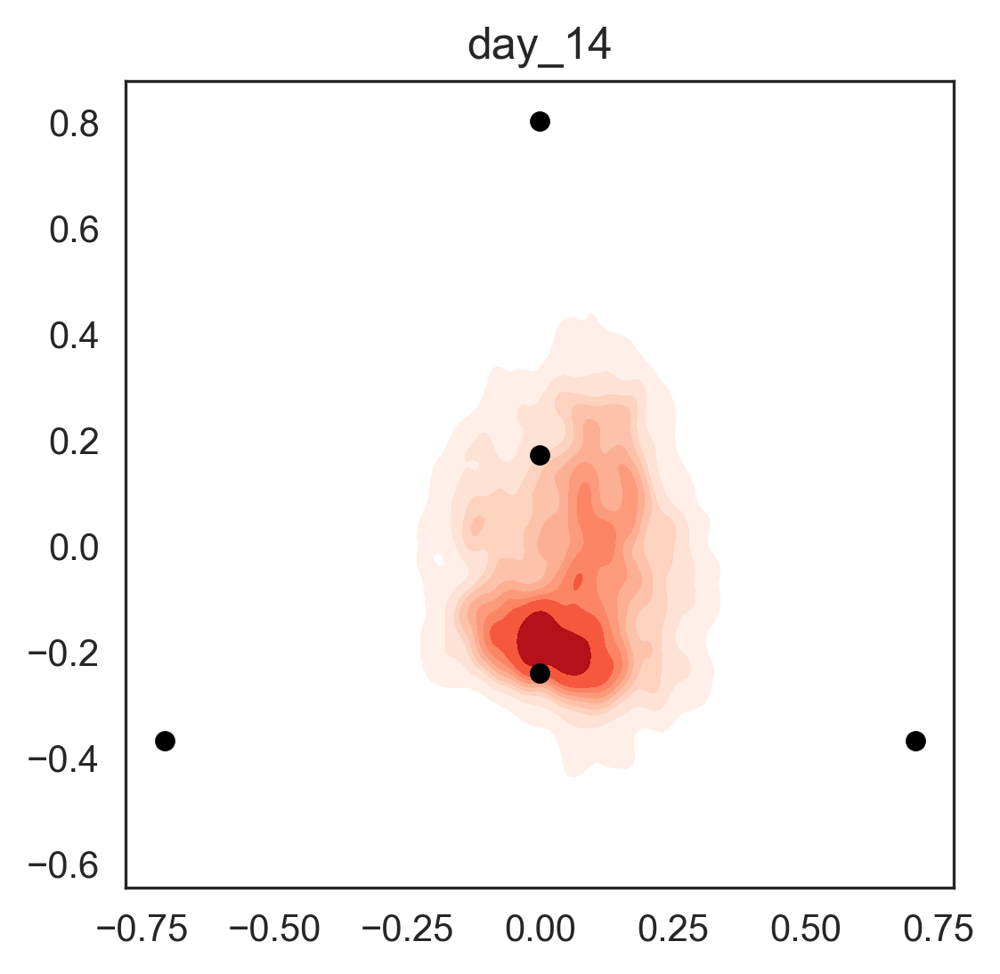

day_17
Index(['SCLC-A2_Score', 'SCLC-N_Score', 'SCLC-P_Score'], dtype='object')


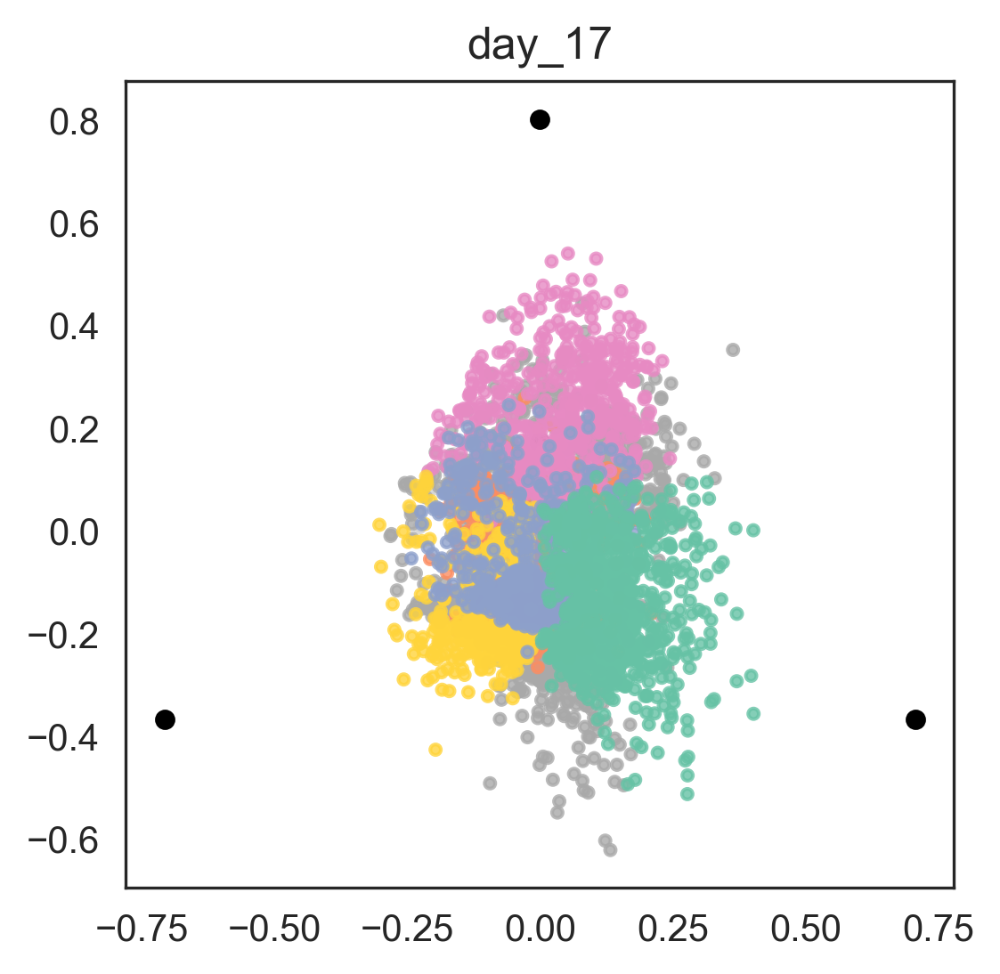

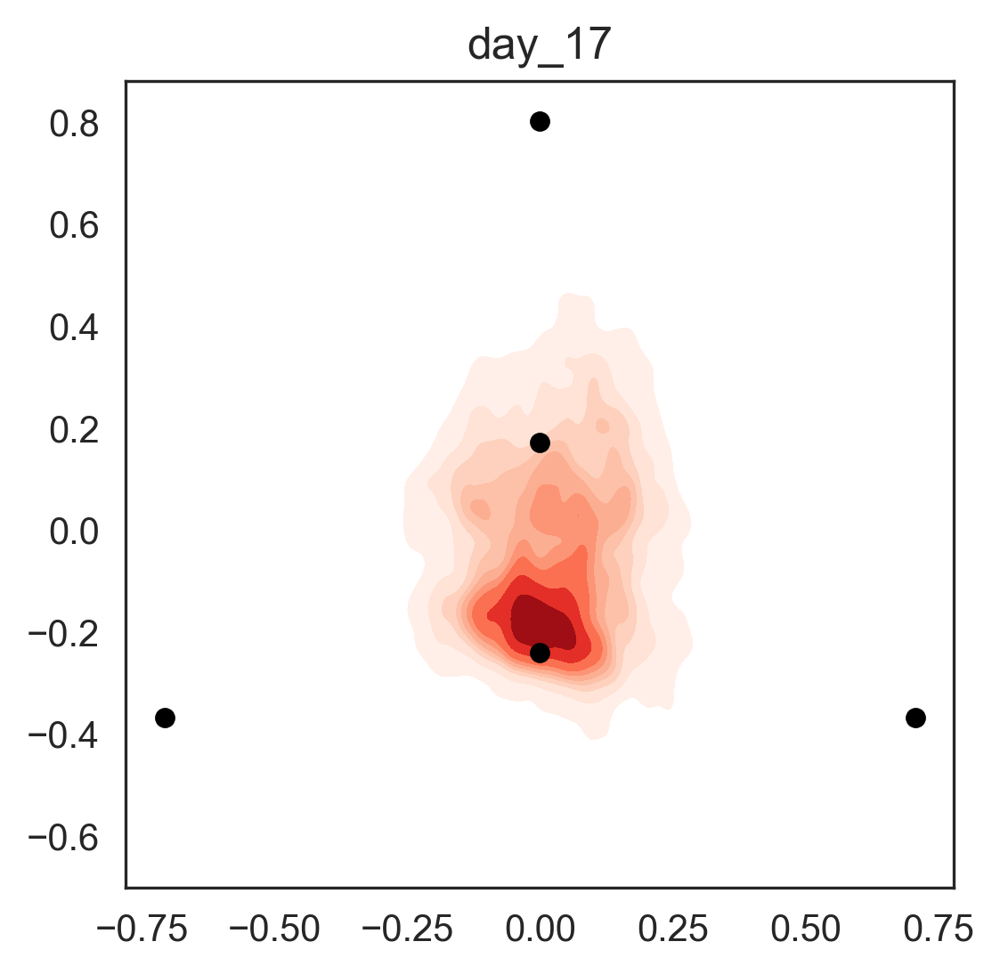

day_21
Index(['SCLC-A2_Score', 'SCLC-N_Score', 'SCLC-P_Score'], dtype='object')


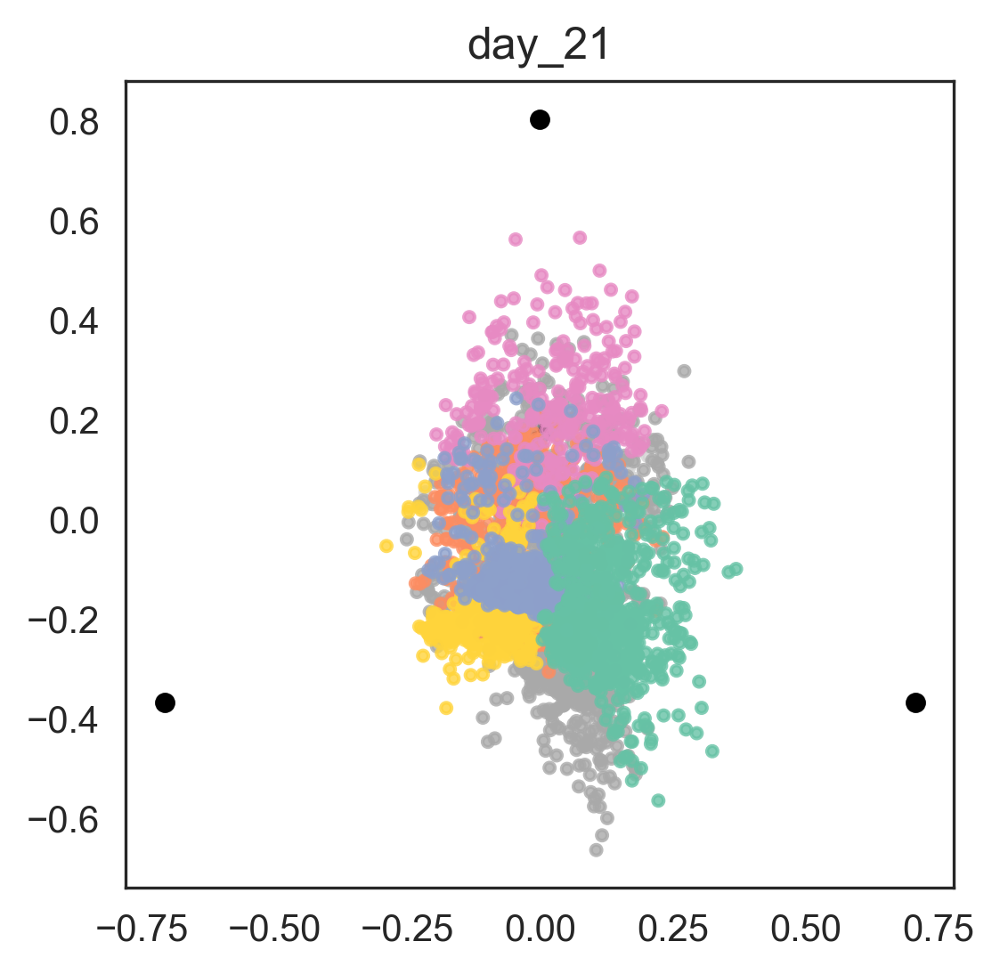

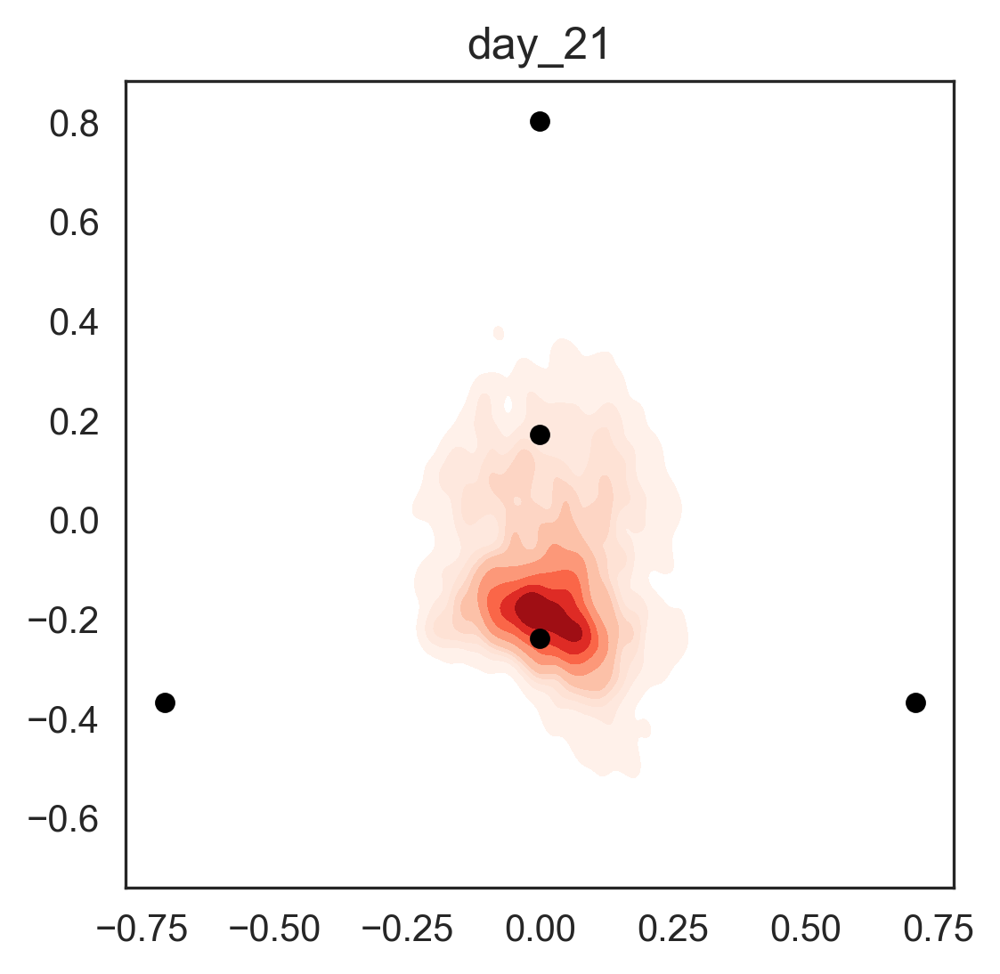

In [8]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
mb.pl.archetype_diagrams(adata, sig_matrix, color_dict=color_dict, groupby='timepoint',color = 'arc_aa_type',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',sizes = 20,
                        figsize=(4,4), score_name = '_Score', alpha = .8, s = 8, arrows = False, density = True)


# Pseudotime and plasticity

We would like to see if we can get the same results as Ireland et al. did for their pseudotime analysis. To run Monocle2, we need the R interface `rpy2`. We'll also use the pseudotime inference within scvelo for comparison.

In [ ]:
scv.tl.terminal_states(adata, groupby='timepoint')

In [ ]:
sc.pl.tsne(adata, color="end_points")

## Velocity pseudotime

In [ ]:
# Velocity pseudotime from scvelo
scv.tl.terminal_states(adata)
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot', basis = 'tsne')

## Diffusion map and diffusion pseudotime

In [ ]:
sc.tl.diffmap(adata)


In [ ]:
sc.pl.diffmap(adata, components='1,2', color='timepoint')
sc.pl.diffmap(adata, components='1,3', color='timepoint')


In [ ]:
#Find the stem cell with the highest DC1 value to act as root for the diffusion pseudotime and compute DPT
stem_mask = np.isin(adata.obs['timepoint'], 'day_4')
min_stem_id = np.argmin(adata.obsm['X_diffmap'][stem_mask,1])
root_id = np.arange(len(stem_mask))[stem_mask][min_stem_id]
adata.uns['iroot'] = root_id

In [ ]:
sc.tl.dpt(adata)
sc.pl.diffmap(adata, color=['dpt_pseudotime', 'timepoint'])


In [ ]:
scv.pl.scatter(adata, color='dpt_pseudotime', basis = 'tsne')

In [ ]:
mb.ps.velocity_paga(adata, basis='tsne')

In [ ]:
sc.pl.scatter(adata, color = 'timepoint', basis = 'tsne')

## Calculate plasticity using CTrP

In [32]:
mb.ps.ctrp_simplified(adata, distance_basis='X_pca')



Eigenvalues:  [1.0000107 0.9997274]
    identified 2 end points
[[0.00090161 0.01024543 0.0013759  ... 0.00241896 0.00051995 0.00146363]
 [0.00090154 0.01024555 0.00137578 ... 0.00241872 0.00051992 0.00146361]
 [0.00089668 0.01022596 0.00136554 ... 0.0023986  0.00051831 0.00145713]
 ...
 [0.00106384 0.0054831  0.00067343 ... 0.00209887 0.00073204 0.00161186]
 [0.00060471 0.01032928 0.00097479 ... 0.00162701 0.00032099 0.00175016]
 [0.0007426  0.00179062 0.00026943 ... 0.00136912 0.00057665 0.00061169]]


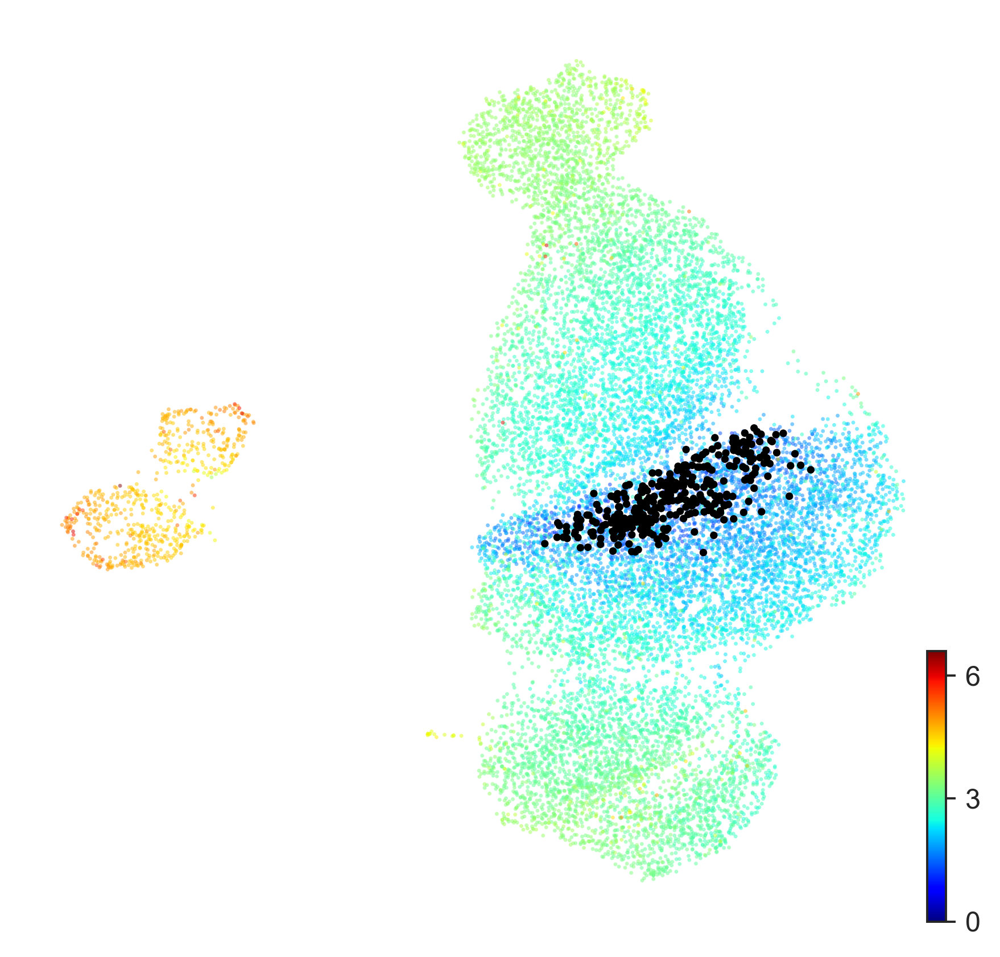

In [33]:
mb.pl.ctrp(adata, basis = 'umap')


Generalist 2.6327197486959513
SCLC-A Specialist 2.364623359185957
SCLC-A2 Specialist 2.8036085607336156
SCLC-N Specialist 2.506151197870387
SCLC-P Specialist 2.50775823881882
SCLC-Y Specialist 2.820936339158927
Unclassified 2.6251476111052723


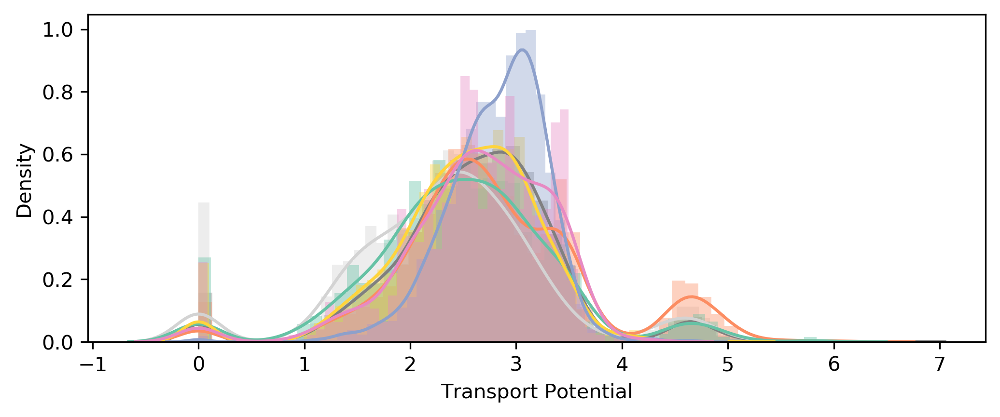

In [34]:
custom_palette = ['grey','lightgrey','#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']

mb.pl.ctrp_hist(adata, groups='arc_aa_type', bins = 50,figsize = (8,3), custom_palette=custom_palette,fname='rpm_hist_pheno')



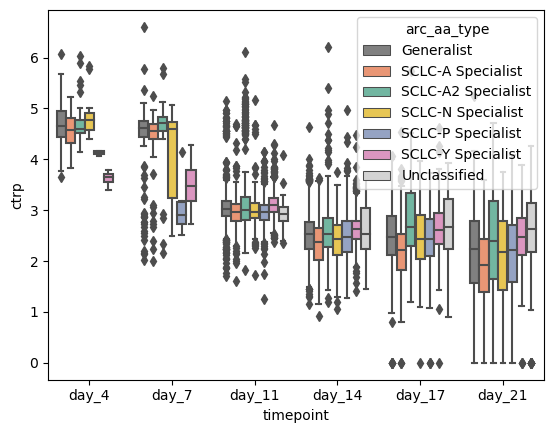

In [47]:
custom_palette = ['grey','#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3', 'lightgrey']

sns.boxplot(data = adata.obs, x = 'timepoint',y="ctrp", hue = 'arc_aa_type', palette = custom_palette)
plt.savefig('./figures/rpm/time_series_ctrp_by_arc_aa_type.pdf')

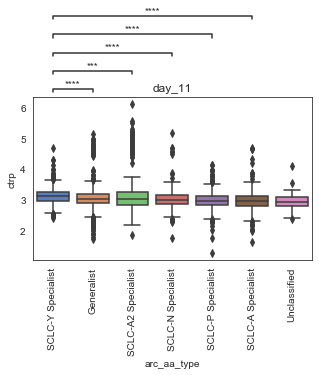

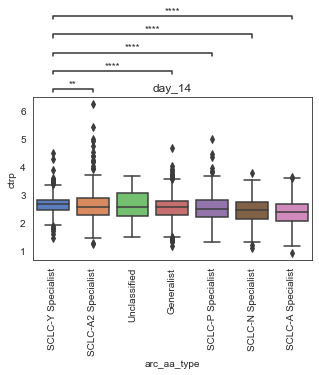

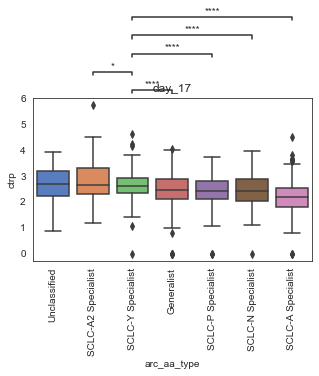

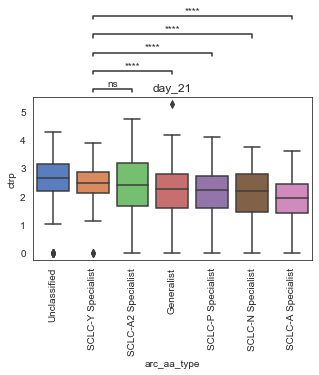

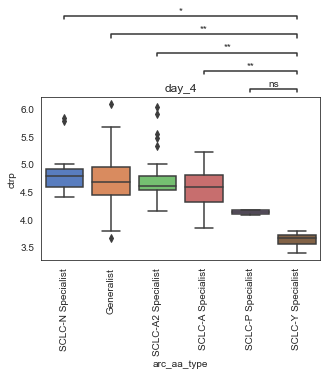

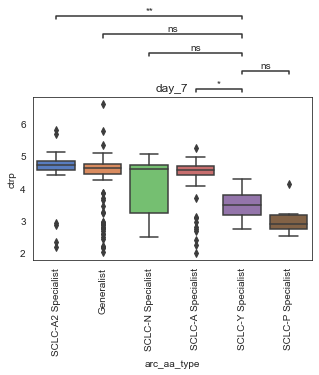

In [11]:
from statannot import add_stat_annotation

for x in sorted(list(set(adata.obs['timepoint']))):
    _adata = adata.copy()[adata.obs['timepoint'] == x]
    plt.figure(figsize = (5,3))
    ax = sns.boxplot(data = _adata.obs, x = 'arc_aa_type',y="ctrp", palette='muted',
                order = _adata.obs.groupby('arc_aa_type').median().sort_values('ctrp',ascending = False).index.values)
    plt.title(x)
    add_stat_annotation(ax, data=_adata.obs, x='arc_aa_type',y = 'ctrp',
                    box_pairs=[("Generalist", 'SCLC-Y Specialist'),("SCLC-Y Specialist", 'SCLC-A Specialist'),("SCLC-Y Specialist", 'SCLC-A2 Specialist'),
                              ("SCLC-Y Specialist", 'SCLC-N Specialist'),("SCLC-Y Specialist", 'SCLC-P Specialist')],
                    test='Mann-Whitney', text_format='star', loc='outside', verbose=0,
                order = _adata.obs.groupby('arc_aa_type').median().sort_values('ctrp',ascending = False).index.values)

    plt.xticks(rotation = 90)
    plt.show()

#     plt.savefig(f"./figures/rpm/{i}_time_series.pdf")

ValueError: box_pairs contains an invalid box pair.

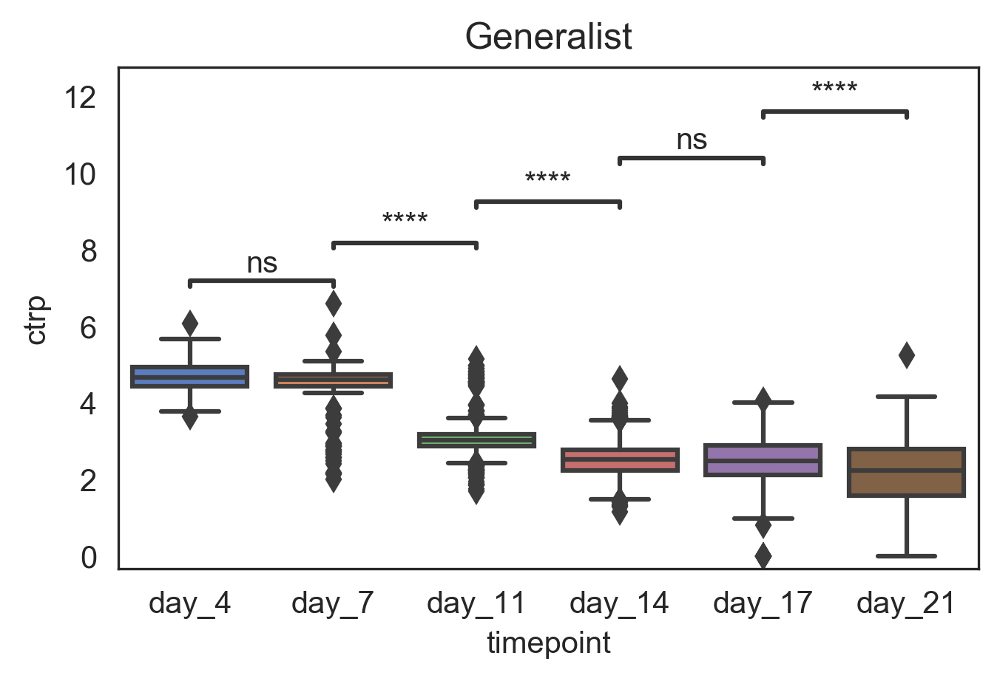

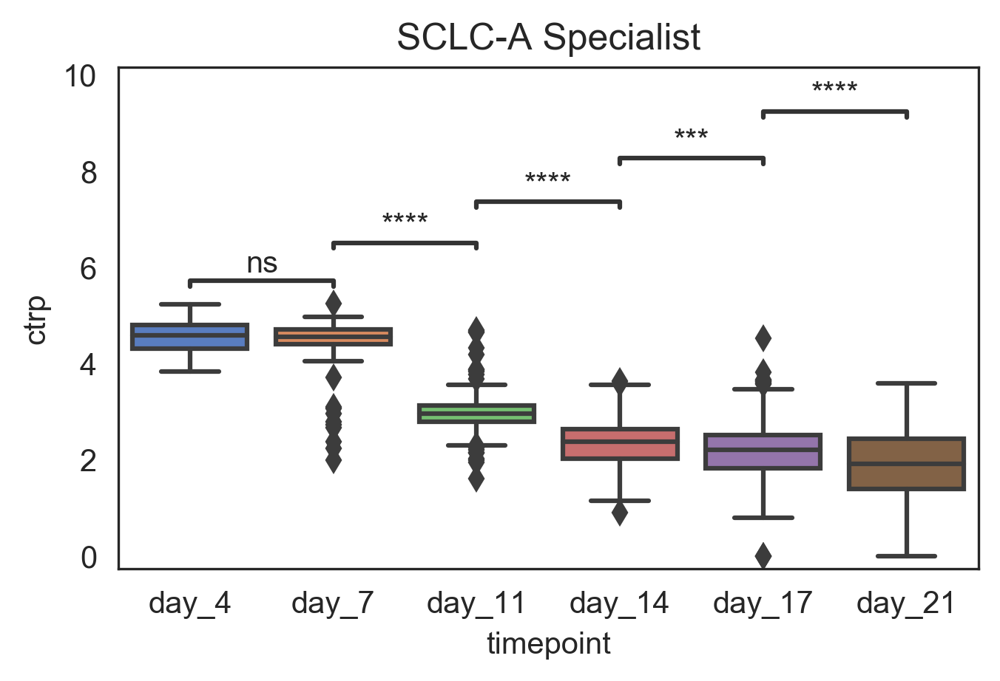

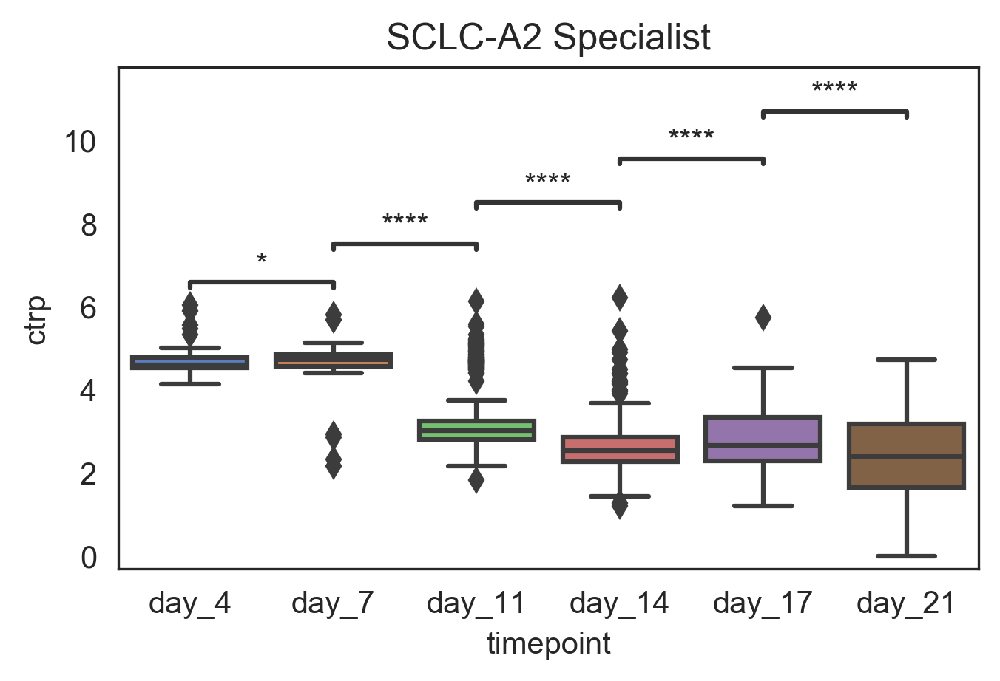

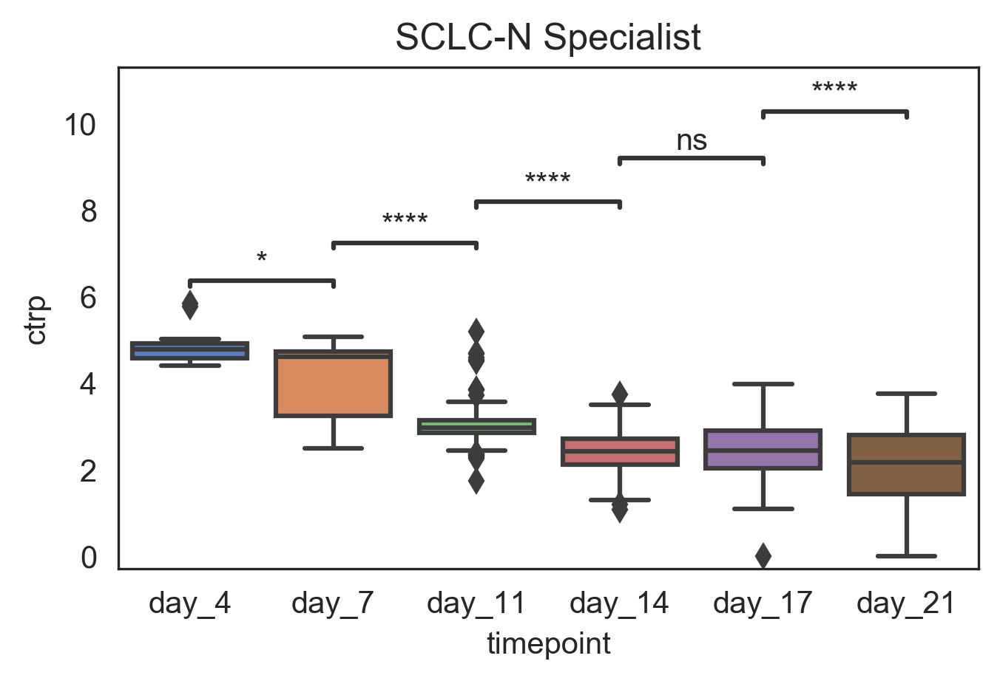

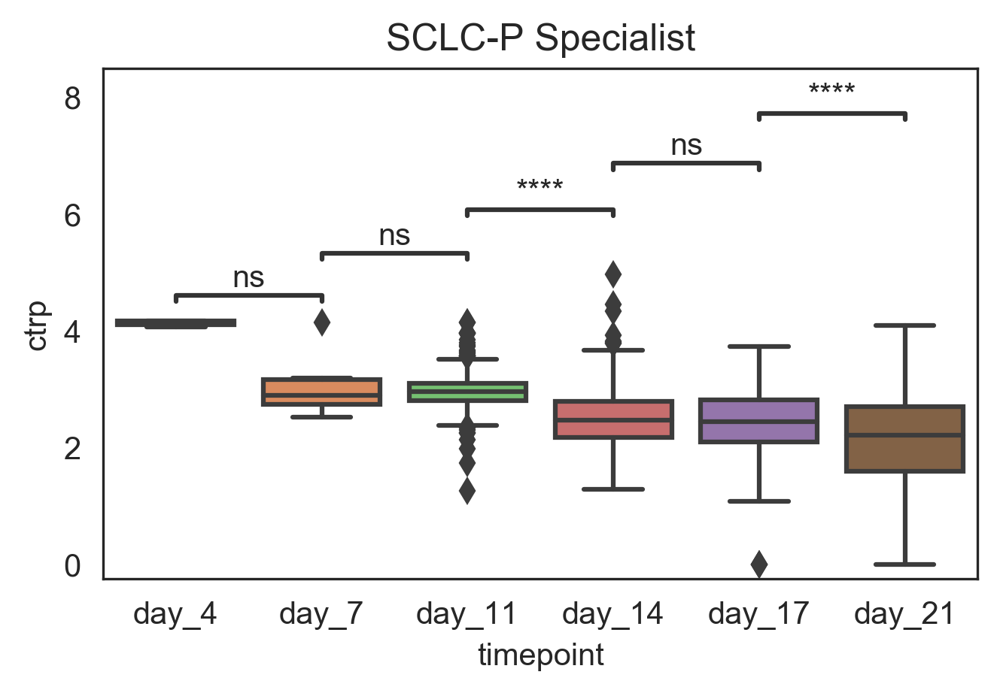

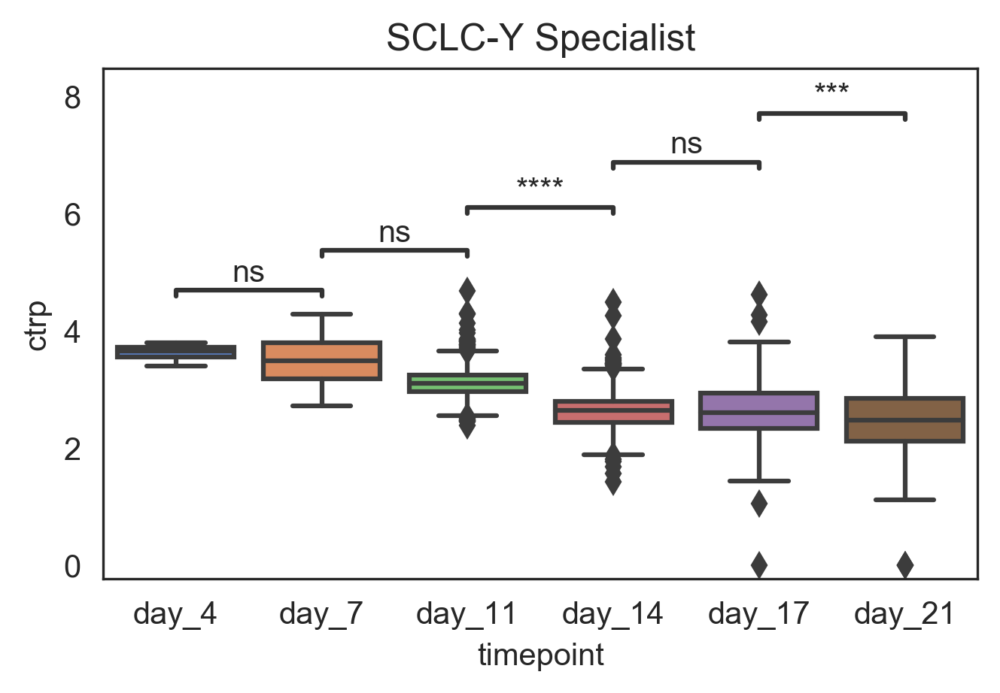

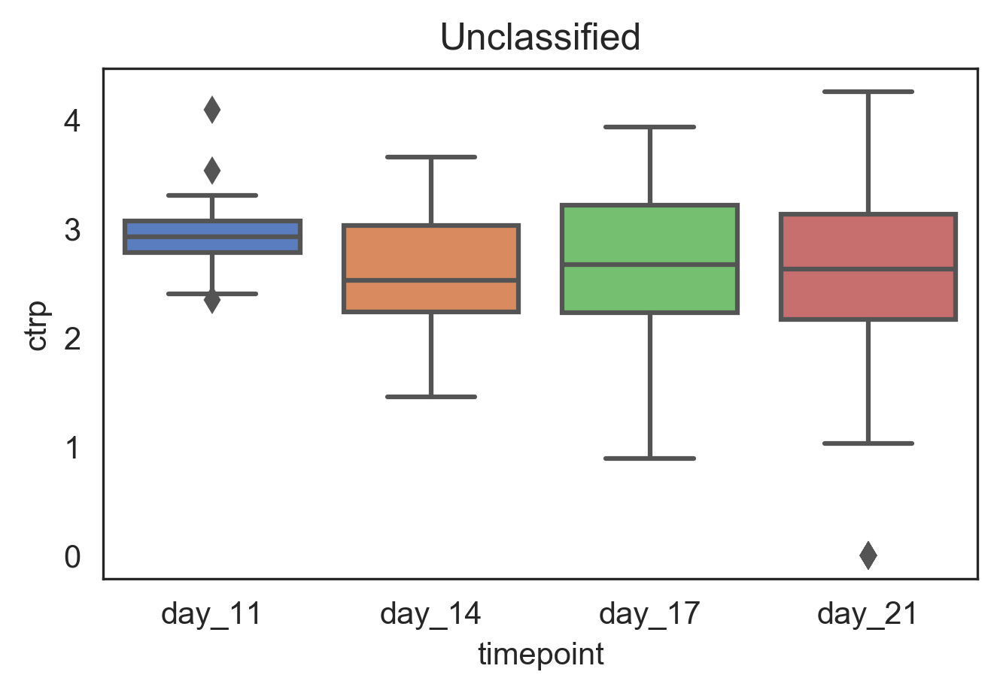

In [12]:
from statannot import add_stat_annotation

for x in sorted(list(set(adata.obs['arc_aa_type']))):
    _adata = adata.copy()[adata.obs['arc_aa_type'] == x]
    plt.figure(figsize = (5,3))
    ax = sns.boxplot(data = _adata.obs, x = 'timepoint',y="ctrp", palette='muted')
    plt.title(x)
    add_stat_annotation(ax, data=_adata.obs, x='timepoint',y = 'ctrp',
                    box_pairs=[("day_4", 'day_7'),("day_7", 'day_11'),("day_11", 'day_14'),
                              ("day_14", 'day_17'),("day_17", 'day_21')],
                    test='Mann-Whitney', text_format='star', loc='inside', verbose=0)
    plt.savefig(f"./figures/rpm/{x}_time_series.pdf")

In [54]:
_adata.obs.groupby('timepoint').mean()

,_X,_Y,dropkick_score,dropkick_label,arcsinh_n_genes_by_counts,initial_size_spliced,initial_size_unspliced,initial_size,n_genes_by_counts,log1p_n_genes_by_counts,...,SCLC-P_Sig_Score,SCLC-P_Z_Score,SCLC-Y_Sig_Score,SCLC-Y_Z_Score,SCLC-A_Score_pos,SCLC-A2_Score_pos,SCLC-N_Score_pos,SCLC-P_Score_pos,SCLC-Y_Score_pos,ctrp
timepoint,,,,,,,,,,,,,,,,,,,,,
day_11,-0.191085,8.628252,0.963083,1.0,8.981526,19179.470588,3292.382353,19179.470703,4095.735294,8.288638,...,0.004762,0.920728,0.009345,1.976504,0.009829,0.018859,0.022718,0.018176,0.023634,2.942107
day_14,-0.841294,1.862598,0.951519,1.0,8.714950,13494.473214,2060.830357,13494.473633,3150.000000,8.022144,...,0.001182,0.376948,0.000070,0.018632,0.000146,0.001833,0.002686,0.002098,0.001904,2.633477
day_17,1.149792,-0.138279,0.974207,1.0,8.741486,14330.734463,2325.259887,14330.734375,3205.327684,8.048667,...,0.000300,0.154283,0.000301,0.068011,0.000428,0.000309,0.000611,0.000744,0.000674,2.681769
day_21,-0.172737,-2.076184,0.982398,1.0,8.823761,16833.139738,2872.951965,16833.140625,3494.895197,8.130918,...,0.000290,0.118067,0.000009,0.002537,0.000310,0.000827,0.000612,0.000663,0.001020,2.530251


In [21]:
adata.write_h5ad('../int/rpm/adata06.h5ad')

In [4]:
adata = sc.read_h5ad('../int/rpm/adata06.h5ad')

(<matplotlib.axes._subplots.AxesSubplot at 0x7ff858cfa550>,
  <statannot.StatResult.StatResult at 0x7ff87dd59d90>])

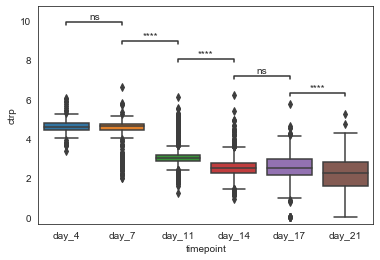

In [13]:
from statannot import add_stat_annotation

plt.figure(figsize=(6,4))
ax = sns.boxplot(data = adata.obs, x='timepoint',y = 'ctrp')
add_stat_annotation(ax, data=adata.obs, x='timepoint',y = 'ctrp',
                    box_pairs=[('day_17','day_21'),
                              ('day_14','day_17'), ("day_11", "day_14"),
                               ("day_7", "day_11"),("day_4", "day_7")],
                    test='Mann-Whitney', text_format='star', loc='inside', verbose=0)
# plt.savefig('ctrp_rpm_timeseries.pdf')

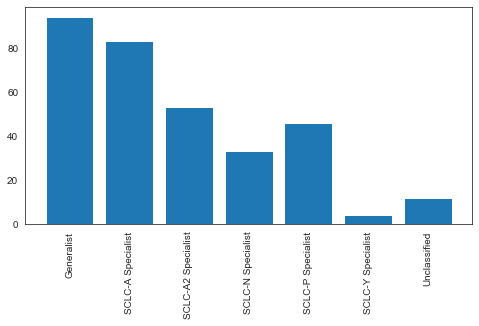

In [19]:
# f, (ax, ax2) = plt.subplots(2, 1, sharex=True, figsize = (6,4))

# plot the same data on both axes
plt.bar(pd.crosstab(adata.obs['arc_aa_type'], adata.obs['absorbing']).index, 
       pd.crosstab(adata.obs['arc_aa_type'], adata.obs['absorbing'])['True'])
plt.xticks(rotation = 90)
# ax2.bar(pd.crosstab(adata_small.obs['Phenotype'], adata_small.obs['absorbing']).index, 
#        pd.crosstab(adata_small.obs['Phenotype'], adata_small.obs['absorbing'])['True'])
# zoom-in / limit the view to different portions of the data
# ax.set_ylim(0, 100)  # outliers only
# # ax2.set_ylim(0, 100)  # most of the data

# # hide the spines between ax and ax2
# ax.spines['bottom'].set_visible(False)
# # ax2.spines['top'].set_visible(False)
# ax.xaxis.tick_top()
# ax.tick_params(labeltop=False)  # don't put tick labels at the top
# ax2.xaxis.tick_bottom()
plt.savefig('./figures/rpm/absorbing_rpm_timeseries.pdf')

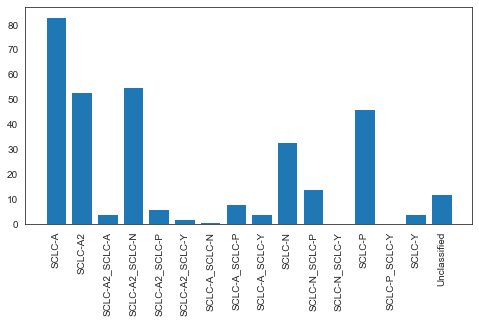

In [20]:
plt.bar(pd.crosstab(adata.obs['arc_pheno'], adata.obs['absorbing']).index, 
       pd.crosstab(adata.obs['arc_pheno'], adata.obs['absorbing'])['True'])
plt.xticks(rotation = 90)
plt.savefig('./figures/rpm/absorbing_arc_pheno.pdf')

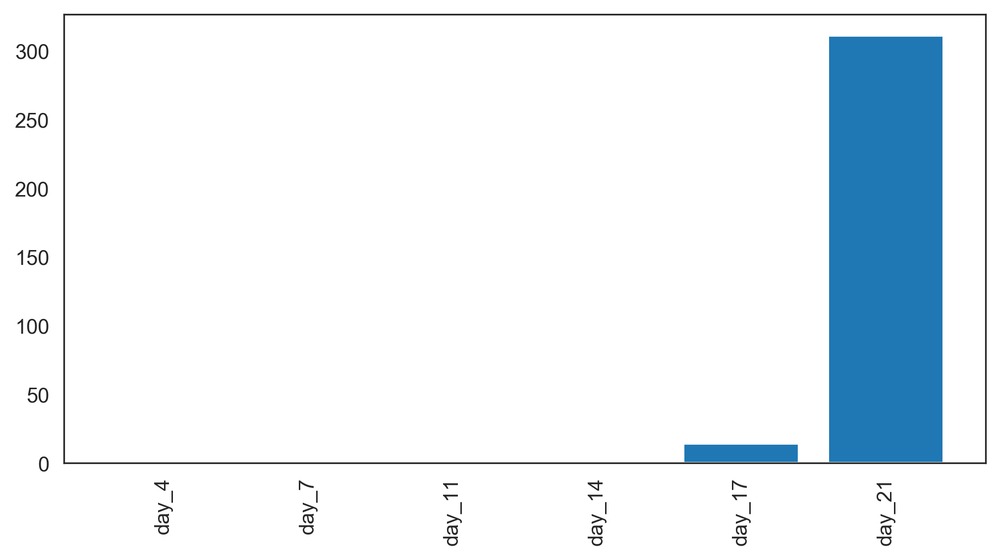

In [16]:
plt.bar(pd.crosstab(adata.obs['timepoint'], adata.obs['absorbing']).index, 
       pd.crosstab(adata.obs['timepoint'], adata.obs['absorbing'])['True'])
plt.xticks(rotation = 90)
plt.savefig('./figures/rpm/absorbing_arc_pheno_timepoint.pdf')

In [ ]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'darkgray', 'None': 'white'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='timepoint',color= 'Phenotype',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',
                        multiplier=1, figsize=(12,12), score_name = '_Score', alpha = .8, s = 4, sizes = 20, arrows = True)



In [ ]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Mixed': 'darkgray', 'None': 'white'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='timepoint',norm = 'None',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'],color = 'log1p_plasticity',
                        multiplier=1, figsize=(8,8), score_name = '_Score', alpha = 1, s = 2, sizes = 8)



In [ ]:
from sklearn.manifold import LocallyLinearEmbedding
def _archetype_diagram_no_arrows(_adata, score_name, color, figsize, order, multiplier,fname,
                                 sizes = None, alpha = .3, s = 30, color_dict = None, norm = 'scale'):
    # X = subtype scores for each subtype (pd dataframe)
    n_samples = len(_adata.obs_names)

    n_types = len(sig_matrix.columns)
    subtypes = sig_matrix.columns
    X = _adata.obs[[f"{x}{score_name}" for x in subtypes]]
    top = X.sum().sort_values(ascending=False)[:3]  # return a list of n largest element
    print(top.index)

    # normalize X to sum to 1 (makes sure that the data fits within the archetype diagram with I matrix = vertices
    X_norm = pd.DataFrame(columns=X.columns)
    if norm == 'scale':
        for i, r in X.iterrows():
            if r.sum() == 0:
                X_norm = X_norm.append(r)
            else:
                X_norm = X_norm.append(r / r.sum())
    elif norm == 'max':
        max = X.max().max()
        X_norm = X / max
    elif norm == 'None':
        X_norm = X

    X = X_norm.fillna(0)
    if type(order) != type(None):
        X = X[[f"{x}{score_name}" for x in order]]
        subtypes = order
    else:
        order = subtypes

    ident = np.identity(n_types)
    for i, x in enumerate(subtypes):
        X = X.append(pd.DataFrame(np.array(ident[i]), index=X.columns, columns=[x]).T)

    embedding = LocallyLinearEmbedding(n_components=2, n_neighbors=4, method='modified', eigen_solver='dense')
    X_transformed = embedding.fit_transform(X[-n_types:])
    X_transformed = X_transformed.T

    X_df_data = embedding.transform(X[:-n_types])
    X_df_data = X_df_data.T

    fig = plt.figure(figsize=figsize)

    ax = fig.add_subplot()
    colors = _adata.obs[color].values
#     if type(colors[0]) == str:
    c = [color_dict[i] for i in colors]
#     else:
#         c = colors
    plt.scatter(X_df_data[0], X_df_data[1], c=c, zorder=1, alpha=alpha, s=s)
    if type(sizes) == int:
        plt.scatter(X_transformed[0, -n_types:], X_transformed[1, -n_types:], c='black',
                    zorder=2, s=sizes)
    else:
        sizes = [Counter(colors)[i] * multiplier / n_samples for i in order]
        print(sizes)
        plt.scatter(X_transformed[0, -n_types:], X_transformed[1, -n_types:], c='black',
                zorder=2, s=sizes)
    plt.axis('tight')
    plt.savefig(f'./figures/{fname}.pdf')
    plt.show()
    plt.close()
    fig = plt.figure(figsize=figsize)

    ax = fig.add_subplot()
    colors = _adata.obs[color].values
    if type(colors[0]) == str:
        c = [color_dict[i] for i in colors]
    else:
        c = colors
    sns.kdeplot(X_df_data[0], X_df_data[1], cmap="Reds", shade=True, bw=.15)
    if type(sizes) == int:
        plt.scatter(X_transformed[0, -n_types:], X_transformed[1, -n_types:], c='black',
                    zorder=2, s=sizes)
    else:
        sizes = [Counter(colors)[i] * multiplier / n_samples for i in order]
        print(sizes)
        plt.scatter(X_transformed[0, -n_types:], X_transformed[1, -n_types:], c='black',
                    zorder=2, s=sizes)
    plt.axis('tight')
    plt.show()
    plt.close()


In [ ]:
adata_small.obs['timepoint'] = adata_small.obs['timepoint'].astype('category')
color_dict = {}
for i,c in enumerate(sorted(list(set(adata_small.obs['timepoint'])))):
#     if i == 7:     color_dict[c] = sns.color_palette('tab10')[9] #skip grey
#     else:
    color_dict[c] = sns.color_palette('tab10',8)[i]
cmap = 'jet'
_archetype_diagram_no_arrows(adata_small, color_dict=color_dict,color='timepoint',fname = 'rpm_archetype_space',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',
                        multiplier=1, figsize=(8,8), score_name = '_Score', alpha = .5, s = 4, sizes = 20)


In [17]:
adata.write_h5ad('../int/rpm/adata06.h5ad')


In [2]:
adata = sc.read_h5ad('../int/rpm/adata06.h5ad')


# Multipotency

In [23]:
from random import seed
from scvelo.tools.utils import scale, groups_to_bool, strings_to_categoricals
from scvelo.preprocessing.neighbors import get_connectivities
from scipy.stats import entropy
def write_to_obs(adata, key, vals, cell_subset=None):
    if cell_subset is None:
        adata.obs[key] = vals
    else:
        vals_all = adata.obs[key].copy() if key in adata.obs.keys() else np.zeros(adata.n_obs)
        vals_all[cell_subset] = vals
        adata.obs[key] = vals_all


def multipotency(data, vkey='velocity', groupby=None, groups=None, self_transitions=True, basis=None, eps_eig = 1e-3,
                    weight_diffusion=0, scale_diffusion=1, eps=1e-2, copy=False, random_seed = 1):
    seed(random_seed)
    adata = data.copy() if copy else data
    strings_to_categoricals(adata)
#     if groupby is not None:
#         logg.warn(
#             "Set groupby IFF you have sufficient evidence that each group occupies a different phenotypic landscape."
#         )

    categories = [None]
    if groupby is not None and groups is None:
        categories = adata.obs[groupby].cat.categories
    aa_types = list(set(adata.obs['arc_aa_type']))
    ent = pd.DataFrame(np.zeros((len(adata.obs_names),len(aa_types)+1)), index=adata.obs_names)
    col = aa_types.copy()
    col.append('entropy')
    ent.columns = col
    for c, cat in enumerate(categories):
        groups = cat if cat is not None else groups
        cell_subset = groups_to_bool(adata, groups=groups, groupby=groupby)
        _adata = adata if groups is None else adata[cell_subset]
        connectivities = get_connectivities(_adata, 'distances')

        T = scv.tl.transition_matrix(_adata, vkey=vkey, basis=basis, weight_diffusion=weight_diffusion,
                              scale_diffusion=scale_diffusion, self_transitions=self_transitions, backward=False)
        print('(' + groups + ')' if isinstance(groups, str) else '')
        T = T.todense()
        Q, ends = mb.ps.extract_Q(T, connectivities = connectivities, eigen=True,eps = eps, eps_eig = eps_eig)
        t_ind,r_ind = mb.ps.return_t_r_indices(T, connectivities = connectivities,eigen = True, eps = eps, eps_eig = eps_eig)
        R = T[t_ind.reshape(-1, 1), r_ind]
        N = mb.ps.compute_N(Q)

        p_abs = N.dot(R)
        p_abs_df = pd.DataFrame(p_abs)
        p_abs_df.columns = _adata[r_ind,].obs_names
        p_abs_df.index = _adata[t_ind,].obs_names
        
        p_abs_df = p_abs_df.append(_adata[r_ind,].obs['arc_aa_type'])
        p_abs_group = p_abs_df.T.groupby('arc_aa_type').sum().T
        for i,r in p_abs_group.iterrows():
            ent.loc[i] = r
            ent.loc[i]['entropy']=entropy(r, base = 2)
        
    ent = ent.fillna(0)
    adata.obs['entropy'] = ent['entropy']
    adata.uns['entropy_prob'] = ent
    return adata if copy else None

In [24]:
multipotency(adata, basis = 'X_pca')


Eigenvalues:  [1.0000107 0.9997274]
    identified 2 end points


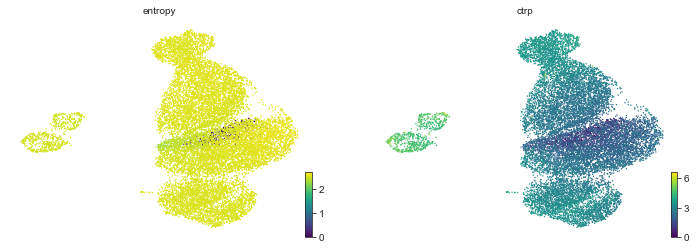

In [25]:
scv.pl.umap(adata, color = ['entropy','ctrp'], cmap = 'viridis')

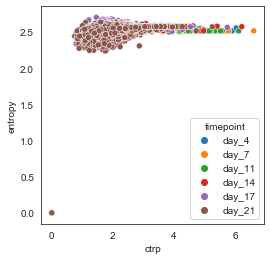

In [26]:
import seaborn as sns
plt.figure(figsize = (4,4))
sns.scatterplot(data=adata.obs, x = 'ctrp', y = 'entropy', hue = 'timepoint')

In [27]:
adata[adata.obs['absorbing']=='False']

View of AnnData object with n_obs × n_vars = 14932 × 21163
    obs: 'Clusters', '_X', '_Y', 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'batch', 'timepoint', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ambient', 'log1p_total_counts_ambient', 'pct_counts_ambient', 'arcsinh_total_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'barcode', 'kept', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'dpt_pseudotime', 'col', 'absorbing', 'absorb_group', 'log1p_plasticity', 'SCLC-Y_Score', 'SCLC-Y_Col', 'SCLC-P_Score', 'SCLC-P_Col', 'SCLC-N_Score', 'SCLC-N_Col', 'SCLC-A2_Score', 'SCLC-A2_Col', 'SCLC-A_Score', 'SCLC-A_Col', 'Phenotype_unfiltered', 'max', 'SCLC-Yscore', '

(array([0, 1, 2, 3, 4, 5, 6]), <a list of 7 Text xticklabel objects>)

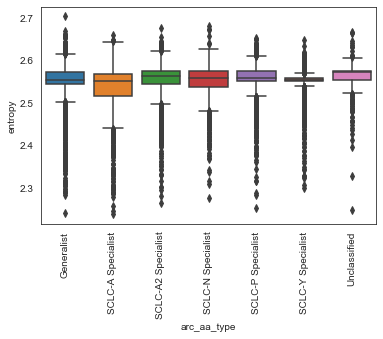

In [28]:
sns.boxplot(data = adata[adata.obs['absorbing']=='False'].obs, x = 'arc_aa_type', y = 'entropy',)
plt.xticks(rotation=90)

In [32]:
entropy([1/7,1/7,1/7,1/7,1/7,1/7,1/7],base = 2)

2.807354922057605

In [33]:
entropy([1/6,1/6,1/6,1/6,1/6,1/6,0],base = 2)

2.584962500721156

In [34]:
entropy([1/5,1/5,1/5,1/5,1/5,0,0],base = 2)

2.3219280948873626

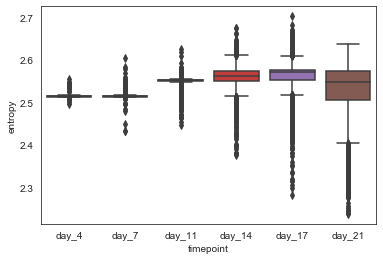

In [30]:
sns.boxplot(data = adata[adata.obs['absorbing']=='False'].obs, x = 'timepoint', y = 'entropy',)


(array([0, 1, 2, 3, 4, 5]), <a list of 6 Text xticklabel objects>)

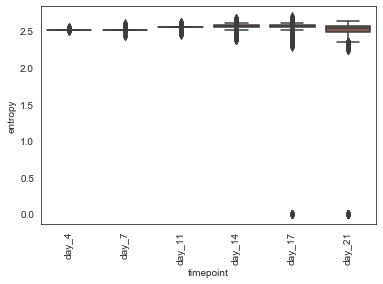

In [29]:
sns.boxplot(data = adata.obs, x = 'timepoint', y = 'entropy',)
plt.xticks(rotation=90)

Trying to set attribute `.uns` of view, copying.


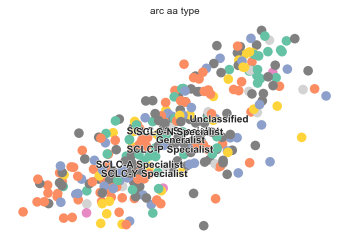

In [46]:
custom_palette = ['grey','#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3', 'lightgrey']

scv.pl.umap(adata[adata.obs['absorbing']=='True'], color = 'arc_aa_type', palette = custom_palette)

In [48]:
sub = ['A','A2','N','P','Y']
adata[adata.obs['absorbing']=='True'].obs[[f"SCLC-{i}_Score_pos" for i in sub]]

,SCLC-A_Score_pos,SCLC-A2_Score_pos,SCLC-N_Score_pos,SCLC-P_Score_pos,SCLC-Y_Score_pos
SRR11594445:ACCCTCAAGCGCCTTGx-day_17,-0.000000,0.024216,0.037891,-0.000000,-0.000000
SRR11594445:ACATTTCCATTACTCTx-day_17,0.071341,-0.000000,-0.000000,-0.000000,0.001789
SRR11594445:ACTATCTAGGTACAATx-day_17,-0.000000,-0.000000,-0.000000,0.165981,-0.000000
SRR11594445:ATCACAGGTGCAACGAx-day_17,-0.000000,0.236774,0.184876,-0.000000,-0.000000
SRR11594445:CATTGCCAGGCACGATx-day_17,0.088571,-0.000000,0.058910,0.179715,-0.000000
...,...,...,...,...,...
SRR11594446:TTTATGCCAGTCGCTGx-day_21,-0.000000,0.097570,0.101823,-0.000000,-0.000000
SRR11594446:TTGCCTGAGGTCGAGTx-day_21,-0.000000,0.230148,0.032224,-0.000000,-0.000000
SRR11594446:TTGGGATAGCGCTGAAx-day_21,-0.000000,0.084758,0.090367,0.055552,-0.000000
SRR11594446:TTTCAGTGTCAACACTx-day_21,-0.000000,0.276389,0.111699,0.159324,-0.000000


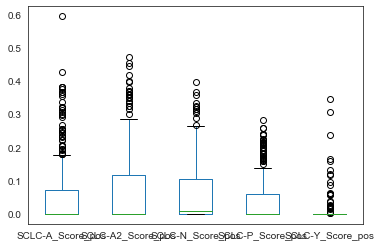

In [49]:
adata[adata.obs['absorbing']=='True'].obs[[f"SCLC-{i}_Score_pos" for i in sub]].plot(kind = 'box')

In [35]:
adata.uns['entropy_prob']

,SCLC-A Specialist,Unclassified,Generalist,SCLC-Y Specialist,SCLC-A2 Specialist,SCLC-N Specialist,SCLC-P Specialist,entropy
SRR11594440:AACCACATCCACCTCAx-0-day_4,0.274789,0.042236,0.246978,0.026813,0.128287,0.123648,0.157365,2.515837
SRR11594440:AAAGGTAGTTGCAAGGx-0-day_4,0.274794,0.042235,0.246976,0.026812,0.128288,0.123647,0.157364,2.515830
SRR11594440:AAGCGAGAGACCAGACx-0-day_4,0.275632,0.041992,0.246854,0.026706,0.127987,0.123486,0.157436,2.514352
SRR11594440:AAGTCGTTCGTAGGGAx-0-day_4,0.276440,0.041831,0.246686,0.026711,0.127502,0.123368,0.157547,2.513321
SRR11594440:AAGTACCGTTCGTACAx-0-day_4,0.274782,0.042239,0.246979,0.026815,0.128283,0.123650,0.157367,2.515852
...,...,...,...,...,...,...,...,...
SRR11594446:TTTGACTGTACCTTCCx-day_21,0.231645,0.070829,0.249296,0.022306,0.179350,0.121324,0.125250,2.570515
SRR11594446:TTTGGAGGTGGCTACCx-day_21,0.221813,0.054409,0.248283,0.026775,0.189010,0.124000,0.135711,2.568055
SRR11594446:TTTGATCAGACTTCGTx-day_21,0.269690,0.041472,0.264035,0.020408,0.128189,0.119657,0.156549,2.487397
SRR11594446:TTTGGTTAGGAAGTGAx-day_21,0.225130,0.049558,0.246648,0.024374,0.201503,0.117364,0.135423,2.546909


In [15]:
from scvelo.utils import groups_to_bool, get_connectivities
def random_walk_to_absorbing_state(adata, starting_type, starting_cell = None, groupby = None,groups = None,n_steps = 100, random_state = 0,
                                    n_neighbors=30,
                                    backward=False,
                                    subtype_label = 'arc_aa_type', self_transitions=True, basis=None, vkey = 'velocity',
                                    weight_diffusion=0, scale_diffusion=1):
    np.random.seed(random_state)
    list_of_walk_subtypes = {}
    subtype_dict = {}
    for x, s in enumerate(sorted(list(set(adata.obs[subtype_label])))):
        subtype_dict[s] = x
    print(subtype_dict)
    categories = [None]
    if groupby is not None and groups is None:
        categories = adata.obs[groupby].cat.categories

    for c, cat in enumerate(categories):
        groups = cat if cat is not None else groups
        cell_subset = groups_to_bool(adata, groups=groups, groupby=groupby)
        _adata = adata if groups is None else adata[cell_subset]
        connectivities = get_connectivities(_adata, 'distances')
        print(cat)
        count = 0
        list_of_walk_subtypes[cat] = []

        if type(starting_type) != type(None):
        
            for start_c in _adata[_adata.obs[subtype_label]== starting_type].obs_names:
                starting_idx = _adata.obs_names.get_loc(start_c)

                X = [starting_idx]
                T = scv.tl.transition_matrix(_adata, vkey=vkey, basis=basis, weight_diffusion=weight_diffusion,
                                          scale_diffusion=scale_diffusion, self_transitions=self_transitions, backward=False)
            #     for _ in range(n_steps):
                ix = -1
                while(_adata.obs['absorbing'].iloc[ix] != 'True'):
                    t = T[X[-1]]
                    indices, p = t.indices, t.data
                    if n_neighbors is not None and n_neighbors < len(p):
                        idx = np.argsort(t.data)[::-1][:n_neighbors]
                        indices, p = indices[idx], p[idx]
                    p /= np.sum(p)
                    ix = np.random.choice(indices, p=p)
                    X.append(ix)
                    if len(X) == 100: break
                X = pd.unique(X)
                list_of_walk_subtypes[cat].append(list([subtype_dict[s] for s in _adata.obs.iloc[X][subtype_label].values]))
                if basis is not None and f"X_{basis}" in _adata.obsm.keys():
                    X = _adata.obsm[f"X_{basis}"][X].T
                if backward:
                    X = np.flip(X, axis=-1)
                count+=1
                if count == 3: 
                    break
    return list_of_walk_subtypes

#         else:
#             if isinstance(starting_cell, str) and starting_cell in adata.obs_names:
#                 starting_cell = adata.obs_names.get_loc(starting_cell)
#             X = [starting_cell]
#             T = scv.tl.transition_matrix(adata, vkey=vkey, basis=basis, weight_diffusion=weight_diffusion,
#                                       scale_diffusion=scale_diffusion, self_transitions=self_transitions, backward=False)
#         #     for _ in range(n_steps):
#             ix = -1
#             while(adata.obs['absorbing'].iloc[ix] != 'True'):
#                 t = T[X[-1]]
#                 indices, p = t.indices, t.data
#                 if n_neighbors is not None and n_neighbors < len(p):
#                     idx = np.argsort(t.data)[::-1][:n_neighbors]
#                     indices, p = indices[idx], p[idx]
#                 p /= np.sum(p)
#                 ix = np.random.choice(indices, p=p)
#                 X.append(ix)
#                 if len(X) == 100: break
#             X = pd.unique(X)
#             if basis is not None and f"X_{basis}" in adata.obsm.keys():
#                 X = adata.obsm[f"X_{basis}"][X].T
#             if backward:
#                 X = np.flip(X, axis=-1)
#     return X

In [16]:
X = random_walk_to_absorbing_state(adata, 'day_4', subtype_label='timepoint')

{'day_11': 0, 'day_14': 1, 'day_17': 2, 'day_21': 3, 'day_4': 4, 'day_7': 5}
None


In [17]:
X

{None: [[4, 5, 5, 4], [4, 5, 5, 5, 0, 5, 5], [4, 5, 5, 5]]}

# Other analyses

In [132]:
import networkx as nx
from networkx.drawing.nx_agraph import to_agraph 
from IPython.display import Image

G = nx.DiGraph()
G.add_nodes_from(subtypes)
G.add_weighted_edges_from([r.values for i,r in sankey_prob['all'].reset_index().iterrows()])
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']

color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'darkgray', 'None': 'lightgray'}

node_colors = []
node_size = []

for node in G.nodes():
    node_colors.append(color_dict[node])
    node_size.append(list(adata.obs['Phenotype'].values).count(node))
    
edges = G.edges()
G.graph['edge'] = {'arrowsize': '0.6', 'splines': 'curved'}
# colors = [G[u][v]['color'] for u,v in edges]
weights = [G[u][v]['weight']*4 for u,v in edges]
pos=nx.circular_layout(G) # pos = nx.nx_agraph.graphviz_layout(G)
# fig = plt.figure(figsize = (6,6))
# nx.draw_networkx(G,pos, width = weights, node_color = node_colors, node_size = node_size, \
#                  connectionstyle = 'arc3')

A = to_agraph(G) 
for node in G.nodes():
    n = A.get_node(node)
    n.attr['color'] = color_dict[node]
A.node_attr["fontsize"] = "8"
A.edge_attr["fontsize"] = "8"

A.node_attr["style"] = "filled"
# A.node_attr['label'] = ''

for edge in G.edges():
    e = A.get_edge(edge[0], edge[1])
    e.attr['label'] = str(np.round(G[edge[0]][edge[1]]['weight']*100,2)) + "%"


A.layout('dot') 
A.draw("./figures/popD_networks/RPM_time_series.pdf", prog="neato", args="-n2")


# labels = nx.get_edge_attributes(G,'weight')
# nx.draw_networkx_edge_labels(G,pos,edge_labels=labels)

In [65]:
!pip install pygraphviz

     |████████████████████████████████| 118 kB 1.2 MB/s eta 0:00:01
  Created wheel for pygraphviz: filename=pygraphviz-1.7-cp37-cp37m-macosx_10_9_x86_64.whl size=98990 sha256=39d38449a6de7b63a3147039d2aaeb79eefca2703ca0e0afde86e221148bfbdb
  Stored in directory: /Users/smgroves/Library/Caches/pip/wheels/8c/bc/0c/ac35392b72556e75107ff610cb31b313e8471918a6d280e34c
Successfully built pygraphviz


In [131]:
from networkx.drawing.nx_agraph import to_agraph 
from IPython.display import Image
node_colors = []
node_size = []

for node in G.nodes():
    node_colors.append(color_dict[node])
    node_size.append(list(adata.obs['Phenotype'].values).count(node))
    
edges = G.edges()
G.graph['edge'] = {'arrowsize': '0.6', 'splines': 'curved'}
# colors = [G[u][v]['color'] for u,v in edges]
weights = [G[u][v]['weight']*4 for u,v in edges]
pos=nx.circular_layout(G) # pos = nx.nx_agraph.graphviz_layout(G)
# fig = plt.figure(figsize = (6,6))
# nx.draw_networkx(G,pos, width = weights, node_color = node_colors, node_size = node_size, \
#                  connectionstyle = 'arc3')

A = to_agraph(G) 
for node in G.nodes():
    n = A.get_node(node)
    n.attr['color'] = color_dict[node]
#     n.attr['height'] = 10*np.sqrt(list(adata.obs['Phenotype'].values).count(node)/len(list(adata.obs['Phenotype'].values)) )
#     n.attr['width'] = 10*np.sqrt(list(adata.obs['Phenotype'].values).count(node)/len(list(adata.obs['Phenotype'].values)) )
A.node_attr["fontsize"] = "8"
A.edge_attr["fontsize"] = "8"

A.node_attr["style"] = "filled"
# A.node_attr['label'] = ''

for edge in G.edges():
    e = A.get_edge(edge[0], edge[1])
    e.attr['label'] = str(np.round(G[edge[0]][edge[1]]['weight']*100,2)) + "%"


A.layout('dot') 
# Image(A.draw(format = 'pdf'))
A.draw("miles.pdf", prog="neato", args="-n2")


# labels = nx.get_edge_attributes(G,'weight')
# nx.draw_networkx_edge_labels(G,pos,edge_labels=labels)

## Doublets

In [13]:
mb.pp.doublet_detections(adata, layer = 'matrix')

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.74
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 11.4%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.5%
Elapsed time: 24.2 seconds


In [14]:
adata.obs.groupby('arc_aa_type').sum()['predicted_doublets']

arc_aa_type
Generalist            4
SCLC-A Specialist     0
SCLC-A2 Specialist    3
SCLC-N Specialist     0
SCLC-P Specialist     1
SCLC-Y Specialist     0
Unclassified          0
Name: predicted_doublets, dtype: int64

### Network inference: Imputation of time points

In [ ]:
mb.pp.magic_recipe(adata, [i.capitalize() for i in tfs], 'Phenotype_filtered', fname='rpm')


In [ ]:
sc.pl.tracksplot(adata, var_names=sorted(list(set([i.capitalize() for i in tfs]).intersection(set(adata.var_names)))),
                 groupby='timepoint', layer = 'Ms')

In [ ]:
mb.network.moments_recipe(adata, fname='rpm_nomagic', genes = [i.capitalize() for i in tfs], clusters='Phenotype_filtered')

## Notch

In [3]:
adata = sc.read_h5ad('../int/RPM/adata06.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 15257 × 21163
    obs: 'Clusters', '_X', '_Y', 'dropkick_score', 'dropkick_label', 'arcsinh_n_genes_by_counts', 'batch', 'timepoint', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ambient', 'log1p_total_counts_ambient', 'pct_counts_ambient', 'arcsinh_total_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'barcode', 'kept', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'dpt_pseudotime', 'col', 'absorbing', 'absorb_group', 'log1p_plasticity', 'SCLC-Y_Score', 'SCLC-Y_Col', 'SCLC-P_Score', 'SCLC-P_Col', 'SCLC-N_Score', 'SCLC-N_Col', 'SCLC-A2_Score', 'SCLC-A2_Col', 'SCLC-A_Score', 'SCLC-A_Col', 'Phenotype_unfiltered', 'max', 'SCLC-Yscore', 'SCLC-Yco

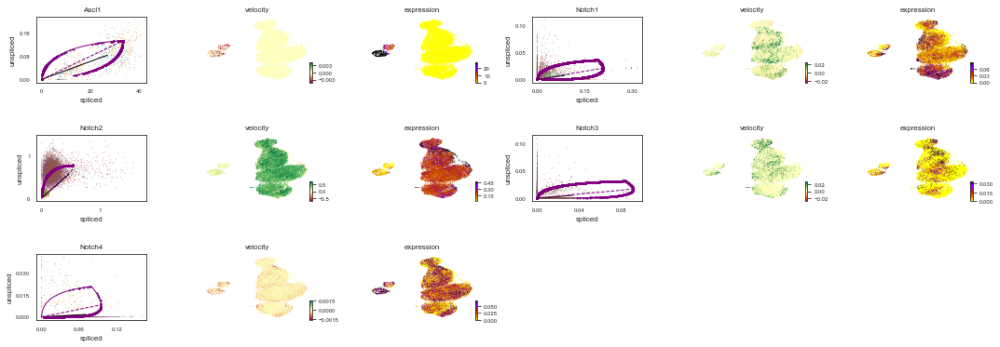

In [16]:
scv.pl.velocity(adata, ['Ascl1',  'Notch1', 'Notch2', 'Notch3','Notch4'], ncols=2, color='timepoint')


In [11]:
scv.tl.recover_dynamics(adata, var_names=['Ascl1',  'Notch1', 'Notch2', 'Notch3','Notch4'])

# top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index

# scv.pl.scatter(adata, basis=top_genes[:15], ncols=5, frameon=False)


recovering dynamics (using 1/16 cores)
    finished (0:00:27) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


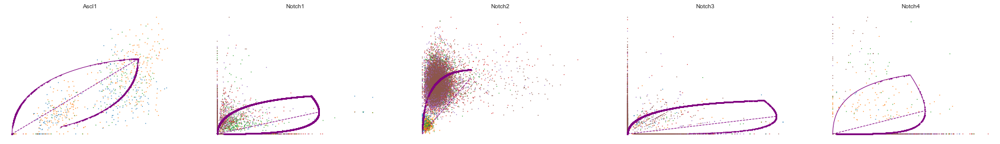

In [12]:
scv.pl.scatter(adata, basis=['Ascl1',  'Notch1', 'Notch2', 'Notch3','Notch4'], ncols=5, frameon=False, color = 'timepoint')


In [13]:
var_names = ['Ascl1',  'Notch1', 'Notch2', 'Notch3','Notch4']
scv.tl.differential_kinetic_test(adata, var_names=var_names, groupby='timepoint')


testing for differential kinetics
    finished (0:00:02) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)


In [15]:
adata.var

,Accession,Chromosome,End,Start,Strand,dropkick_coef-day_11,dropkick_coef-day_14,dropkick_coef-day_17,dropkick_coef-day_21,dropkick_coef-0-day_4,...,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_diff_kinetics,fit_pval_kinetics
Rplp1,ENSMUSG00000007892,9,61914542,61913284,-,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
Rps8,ENSMUSG00000047675,4,117156243,117153827,-,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
Ftl1,ENSMUSG00000050708,7,45459884,45457944,-,NaN,NaN,0.0,0.03,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
Rplp2,ENSMUSG00000025508,7,141451585,141447370,+,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
Hsp90ab1,ENSMUSG00000023944,17,45573271,45567775,-,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Nr0b1,ENSMUSG00000025056,X,86195947,86191764,+,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
Sox1,ENSMUSG00000096014,8,12400126,12395295,+,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
Chat,ENSMUSG00000021919,14,32465989,32408203,-,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
Neurod1,ENSMUSG00000034701,2,79456751,79452521,-,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
